In [1]:
import numpy as np
import pandas as pd
import os
from pathlib import Path
import time
import glob
import re
import gc

import matplotlib
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

from dask.distributed import Client
from IPython.display import IFrame

from tqdm.notebook import tqdm

from skimage.transform import ProjectiveTransform, AffineTransform, EuclideanTransform, warp
from sklearn.linear_model import (LinearRegression,
                                  TheilSenRegressor,
                                  RANSACRegressor,
                                  HuberRegressor,
                                  RidgeCV,
                                  LassoCV)
import mrcfile
try:
    import skimage.external.tifffile as tiff
except:
    import tifffile as tiff

from SIFT_gs.FIBSEM_SIFT_gs import FIBSEM_frame, FIBSEM_dataset
from SIFT_gs.FIBSEM_SIFT_gs import get_min_max_thresholds, get_spread
from SIFT_gs.FIBSEM_SIFT_gs import (ShiftTransform,
                                    XScaleShiftTransform,
                                    ScaleShiftTransform,
                                    RegularizedAffineTransform)
            
from SIFT_gs.FIBSEM_SIFT_gs import (generate_report_mill_rate_xlsx,
                                    generate_report_FOV_center_shift_xlsx,
                                    generate_report_data_minmax_xlsx,
                                    generate_report_ScanRate_EHT_xlsx,
                                    generate_report_transf_matrix_from_xlsx,
                                    generate_report_from_xls_registration_summary,
                                    plot_registrtion_quality_xlsx,
                                    read_kwargs_xlsx)
                        
from SIFT_gs.FIBSEM_SIFT_gs import plot_cross_sections_mrc_stack, add_scale_bar
from SIFT_gs.FIBSEM_SIFT_gs import (bin_crop_mrc_stack,
                                    show_eval_box_mrc_stack,
                                   analyze_mrc_stack_registration)
from SIFT_gs.FIBSEM_SIFT_gs import plot_2D_blob_results, plot_2D_blob_examples
from SIFT_gs.FIBSEM_SIFT_gs import build_kernel_FFT_zero_destreaker_XY, build_kernel_FFT_zero_destreaker_radii_angles
from SIFT_gs.FIBSEM_SIFT_gs import (destreak_mrc_stack_with_kernel,
                                    destreak_single_frame_kernel_shared,
                                    smooth_mrc_stack_with_kernel)

skimage version:  0.19.2
scipy version:    1.9.1
sklearn version:  1.0.2
Open CV version:  4.10.0
SIFT_gs version:  4.0.1


# Set up Local DASK Client and Monitor Window

In [2]:
#start / restart client
try:
    client.restart()
except:
    client = Client()
    
# setup a window to monitor the client progress
try:
    dport = client.scheduler_info()['services']['dashboard']
except:
    dport = client.scheduler_info()['services']['bokeh']
print('Using Local Port:   ', dport)
status_update_address = 'http://localhost:{:d}/status'.format(dport)
IFrame(src=status_update_address, width='100%', height='900px')

C:\Users\labadmin\anaconda3\lib\site-packages\distributed\node.py:179: UserWarning: Port 8787 is already in use.
Perhaps you already have a cluster running?
Hosting the HTTP server on port 55341 instead
  warnings.warn(


Using Local Port:    55341


# This is where the data processing begins.

# Step 0a: Set up the Processing Parameters.

In [11]:
data_dir = 'Y:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz'

ftype = 0 # 0 for Shan's .dat files, 1 for tif files

DASK_client_retries = 3  # Number of allowed automatic retries if a task fails

threshold_min = 1e-3    # These are used to determine Min and Max data boundaries for I8 conversion
threshold_max = 1e-3                            
sliding_minmax = True   # If True, Global Min and Max for I8 conversion the entire data set is used. If False, Min and Max are allowed to vary slowly.
nbins = 256             # Number of histogram bins for determining Min and Max above

BFMatcher = False       # If True, the BF Matcher is used for keypont matching
                        # otherwise FLANN Matcher (faster, preferable) is used.

save_matches = True     # If True, matches will be saved into individual files

# Uncomment one from the below choices:
#TransformType = ShiftTransform                #  only x-shift and y-shift
#TransformType = XScaleShiftTransform          #  x-scale, x-shift, y-shift
#TransformType = ScaleShiftTransform           #  x-scale, y-scale, x-shift, y-shift
#TransformType = AffineTransform               #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
TransformType = RegularizedAffineTransform     #  full Affine (x-scale, y-scale, rotation, shear, x-shift, y-shift)
                                                # with regularization on deviation from ShiftTransform
if TransformType == RegularizedAffineTransform:
    l2_param = 1e-5                                  # regularization strength (shrinkage parameter)
    l2_matrix = np.eye(6)*l2_param                   # initially set equal shrinkage on all coefficients
    l2_matrix[2,2]=0                                 # turn OFF the regularization on shifts
    l2_matrix[5,5]=0                                 # turn OFF the regularization on shifts
    targ_vector = np.array([1, 0, 0, 0, 1, 0])       # target transformation is shift only: Sxx=Syy=1, Sxy=Syx=0
    suffix = 'l2_{:.0e}'.format(l2_matrix[0,0])
else:
    l2_matrix= None
    targ_vector = None
    suffix = 'bilin'                  # optonal characters that will be added to the end of the filename (before the extension)

SIFT_nfeatures = 0     # SIFT libary default is 0. The number of best features to retain.
                                # The features are ranked by their scores (measured in SIFT algorithm as the local contrast)
    
SIFT_nOctaveLayers = 3          # SIFT libary default  is 3. The number of layers in each octave.
                                # 3 is the value used in D. Lowe paper. The number of octaves is computed automatically from the image resolution.

SIFT_contrastThreshold = 0.025   # SIFT libary default  is 0.04. The contrast threshold used to filter out weak features in semi-uniform (low-contrast) regions.
                                # The larger the threshold, the less features are produced by the detector.
                                # The contrast threshold will be divided by nOctaveLayers when the filtering is applied.
                                # When nOctaveLayers is set to default and if you want to use the value used in
                                # D. Lowe paper (0.03), set this argument to 0.09.
                                
SIFT_edgeThreshold = 10         # SIFT libary default  is 10. The threshold used to filter out edge-like features.
                                # Note that the its meaning is different from the contrastThreshold,
                                # i.e. the larger the edgeThreshold, the less features are filtered out
                                # (more features are retained).

SIFT_sigma = 2.0                # SIFT library default is 1.6. 	The sigma of the Gaussian applied to the input image at the octave #0.
                                # If your image is captured with a weak camera with soft lenses, you might want to reduce the number.
    
Lowe_Ratio_Threshold = 0.7

solver = 'RANSAC'       # String indicating which solver is to be used.'RANSAC' will use RANSAC (Random Sample Consensus) algorithm.
                        # 'LinReg' will use Linear Regression with iterative "Throwing out the Worst Residual" Heuristic
RANSAC_initial_fraction = 0.001  # fraction of data points for initial RANSAC iteration step.
    
drmax = 1.5              # dimensions - pixels.
                         #  - in the case of 'RANSAC' - Maximum distance for a data point to be classified as an inlier.
                         #  - in the case of 'LinReg' - outlier threshold for iterative regression:
                         # For each matched pair of keypoins the error is calculated as err[j] = dst_pts[j] - A*src_pts[j]
                         # The iterative procedure throws away the matched keypoint pair with worst error on every iteration
                         # until the worst error falls below drmax or the max number of iterations is reached.

max_iter = 1000             # max number of iterations in the iterative procedure above

save_data_as_tiff = False    # Convert and Save the InLens.tif data

save_res_png = True          # Save PNG images of the intemediate processing statistics and final registration quality check.

dtp = np.int16                  # Python data type for saving. Deafult is int16, the other option currently is uint8.

preserve_scales = True       # If True, the transformation matrix will be adjusted using the settings defined by fit_params below
fit_params = ['SG', 101, 3]  # perform the above adjustment using  Savitzky-Golay (SG) filter with parameters
                             # window size 501, polynomial order 3
#fit_params = ['LF']         # another option is to use linear fit with forces start points Sxx and Syy = 1 and Sxy and Syx = 0
#fit_params = ['PF', 2]      # another option is to use polynomial fit (in this case of order 2)

subtract_linear_fit = [True, True]  # If True, the linear slopes along X- and Y- directions (respectively) will be subtracted from the cumulative shifts.
                                    # This is performed after the optimal frame-to-frame shifts are recalculated for preserve_scales = True 
subtract_FOVtrend_from_fit = [True, True]  # If True, FOV trends (image shifts performed during imaging) will be subtracted first, so they do not bias the linear trends.

pad_edges = True             # If True, the edges will be padded with the amount equal to max shift excursion in each direction

flipY = False                 # If True, the dataset will be flipped along Y-direction

zbin_factor =  1             # binning factor in z-direction (milling direction). Data will be binned when saving the final result. Default is 1.

eval_metrics = ['NSAD', 'NCC', 'NMI']   # list of metrics used for evaluation of registration (and resolution).
                                        # Options are; 'NSAD', 'NCC', 'NMI', 'FSC'
fnm_types = ['mrc']    #   File type(s) for output data. Options are: ['h5', 'mrc'].
                             # Defauls is ['mrc']. 
                             # 'h5' is BigDataViewer HDF5 format, uses npy2bdv package. Use empty list if do not want to save the data.

int_order = 1                #     The order of interpolation. The order has to be in the range 0-5:
                             #    - 0: Nearest-neighbor
                             #    - 1: Bi-linear (default)
                             #    - 2: Bi-quadratic
                             #    - 3: Bi-cubic
                             #    - 4: Bi-quartic
                             #    - 5: Bi-quintic
                        
                        

#********************************************************************************************************
# DO NOT MODIFY THE CODE BELOW!
#********************************************************************************************************           

if ftype == 0:
    fls = sorted(glob.glob(os.path.join(data_dir,'*.dat')))
    if len(fls) < 1:
        fls = sorted(glob.glob(os.path.join(data_dir,'*/*.dat')))
if ftype == 1:
    fls = sorted(glob.glob(os.path.join(data_dir,'*.tif')))
    if len(fls) < 1:
        fls = sorted(glob.glob(os.path.join(data_dir,'*/*.tif')))

nfrs = len(fls)
#print('Total Number of frames to process: ', nfrs)                      

if fit_params[1] > nfrs//2*2-1:  # if smoothing aperture (Sov-Gol) is larger than number of frames, reduce the aperture
    fit_params[1] = nfrs//2*2-1

fnm0 = (os.path.join(data_dir,fls[0]))
frame0 = FIBSEM_frame(fnm0, ftype=ftype)
Sample_ID = frame0.Sample_ID.strip('\x00')
EightBit = frame0.EightBit

SIFT_kwargs = {
    'ftype' : ftype,
    'data_dir' : data_dir,
    'Sample_ID' : Sample_ID,
    'EightBit' : EightBit,
    'DASK_client_retries' : DASK_client_retries,
    'threshold_min' : threshold_min, 
    'threshold_max' : threshold_max,
    'sliding_minmax' : sliding_minmax,
    'nbins' : nbins,
    'TransformType' : TransformType,
    'SIFT_nfeatures' : SIFT_nfeatures,
    'SIFT_nOctaveLayers' : SIFT_nOctaveLayers,
    'SIFT_contrastThreshold' : SIFT_contrastThreshold,
    'SIFT_edgeThreshold' : SIFT_edgeThreshold,
    'SIFT_sigma' : SIFT_sigma,
    'Lowe_Ratio_Threshold' : Lowe_Ratio_Threshold,
    'l2_matrix' : l2_matrix,
    'targ_vector': targ_vector, 
    'solver' : solver,
    'RANSAC_initial_fraction' : RANSAC_initial_fraction,
    'drmax' : drmax,
    'max_iter' : max_iter,
    'BFMatcher' : BFMatcher,
    'save_matches' : save_matches,
    'save_res_png' : save_res_png,
    'save_data_as_tiff' : save_data_as_tiff,
    'dtp' : dtp,
    'preserve_scales' : preserve_scales,
    'fit_params' : fit_params,
    'subtract_linear_fit' : subtract_linear_fit,
    'subtract_FOVtrend_from_fit' : subtract_FOVtrend_from_fit,
    'pad_edges' : pad_edges,
    'flipY' : flipY,
    'zbin_factor' : zbin_factor,
    'eval_metrics' : eval_metrics,
    'fnm_types' : fnm_types,
    'int_order' : int_order,
    'suffix' : suffix}

test_dataset = FIBSEM_dataset(fls, fnm_reg = 'Registered_brat0.00.mrc', **SIFT_kwargs)

2024/07/08  17:06:40   Registered data will be saved into:  Registered_brat0.00.mrc
Total Number of frames:  15782


In [12]:
data_dir = 'Y:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz/Results'

header scaling data: [[ 1.25000000e+06  1.25000000e+06]
 [-6.85270020e+03 -5.78000000e+03]
 [ 2.86006987e-01  1.35261998e-01]
 [ 1.00000000e-01  1.00000000e-01]]
The EM data range for display:            -48.8 - 5818.4
The EM data range for noise analysis:     110.9 - 4291.7
popt:  [1.25067302e+01 8.60195973e+04]
I_array:  [ 110.86296846 4291.69697638 1704.46286153]
Slope of linear fit with header offset: 12.54
Var at peak: 107336.9
PSNR=26.20, PSNR_header=26.12, DSNR=12.76
2024/07/08  17:07:30   results saved into the file: Y:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz/Results\Gemini500-7029_19-08-01_081849_0-0-0_RawImageA_Noise_Analysis.png
The EM data range for display:            -3152.4 - 691.5
The EM data range for noise analysis:     -2664.4 - -11.7
popt:  [2.42753857e+02 1.45494020e+06]
I_array:  [-2664.36082929   -11.7361884  -1358.04879642]
Slope of linear fit with header offset: 254.73
Var at peak: 1125268.6
PSNR=4.37, PSNR_header=4.17, DSNR=2.50
202

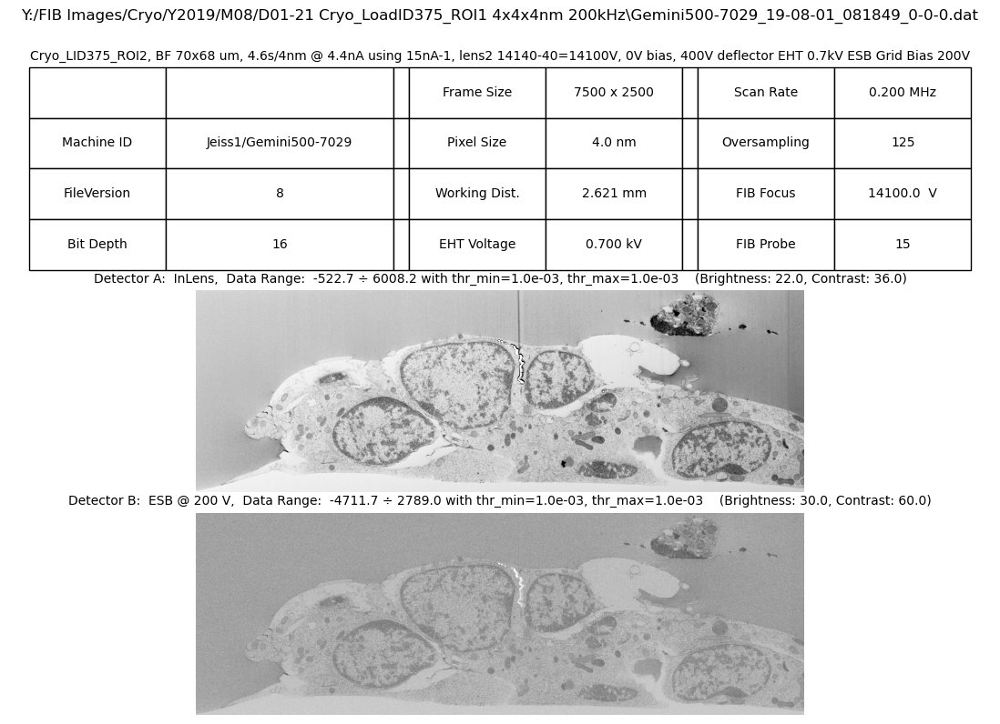

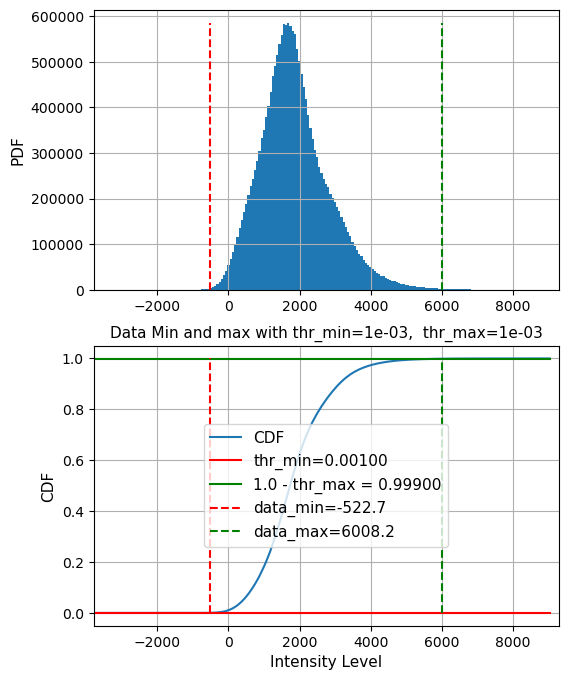

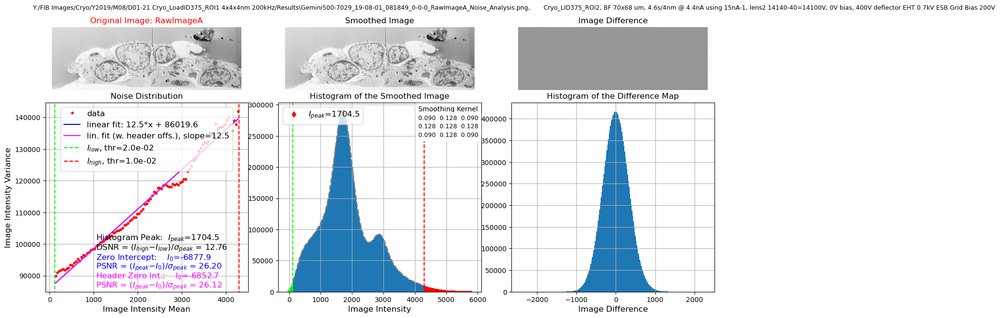

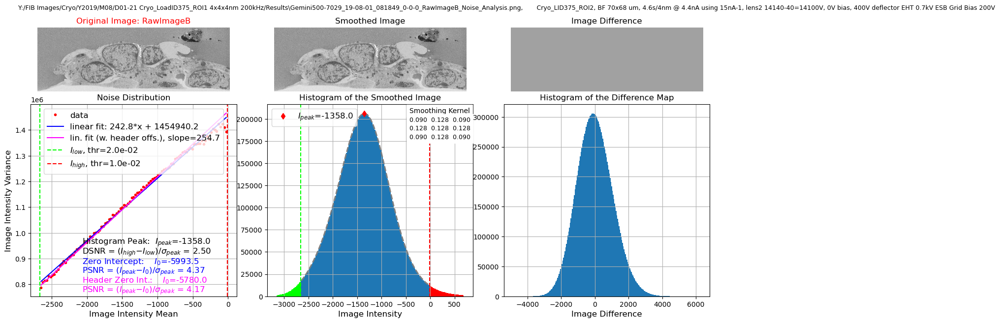

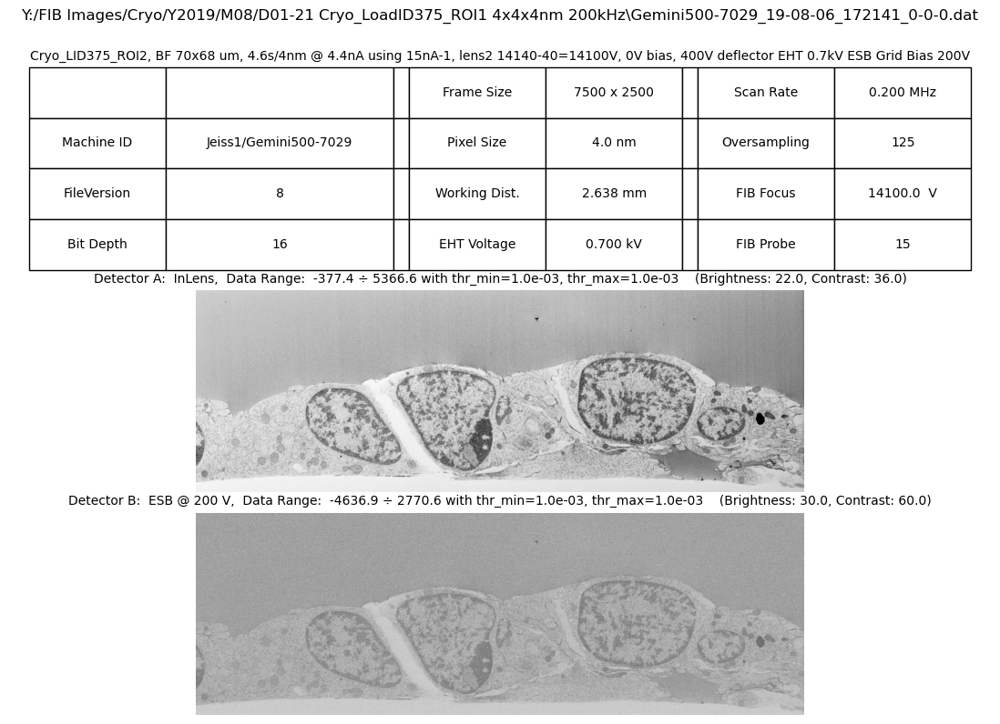

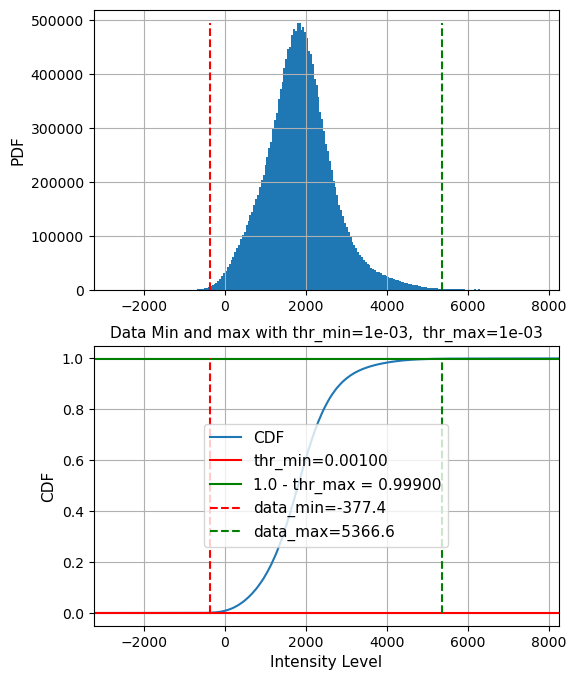

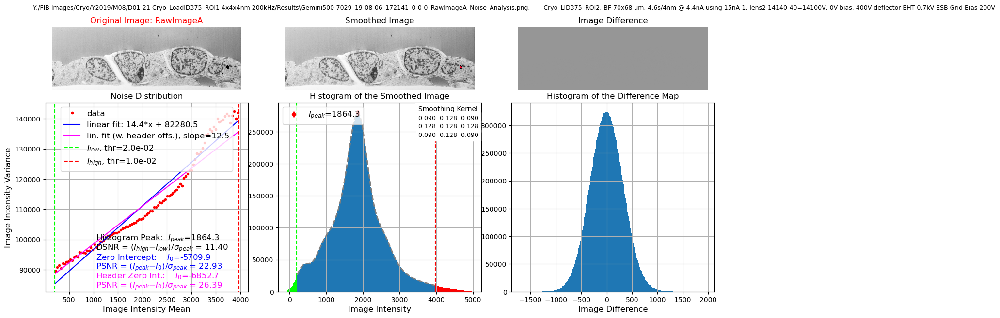

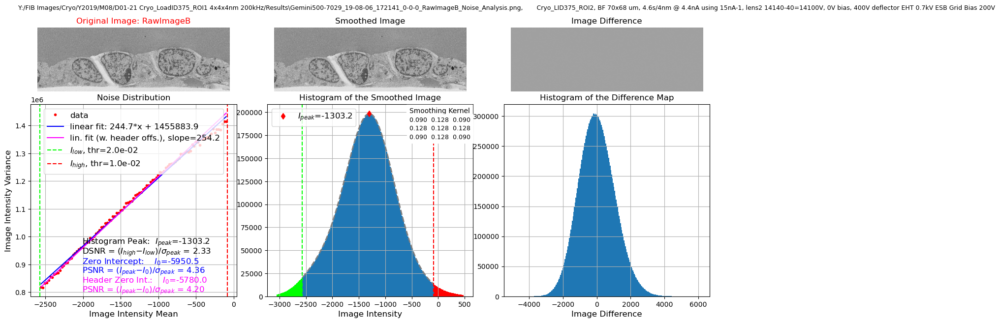

In [13]:
fr_inds = [1000, 5000]
for fr_ind in fr_inds:
    test_frame = FIBSEM_frame(fls[fr_ind])
    test_frame_suff = Path(test_frame.fname).suffix
    snapshot_name = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_snapshot.png'))
    test_frame.save_snapshot(snapshot_name=snapshot_name)
    get_min_max_thresholds(test_frame.RawImageA, disp_res=True)
    test_frame.save_images_tif()

    print('header scaling data:', test_frame.Scaling)
    image_name = 'RawImageA'
    res_fname = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis.png'))
    RawImageA_results = test_frame.analyze_noise_statistics(image_name=image_name, res_fname = res_fname)
    image_name = 'RawImageB'
    res_fname = os.path.join(data_dir, os.path.split(fls[fr_ind])[1].replace(test_frame_suff, '_' + image_name + '_Noise_Analysis.png'))
    RawImageA_results = test_frame.analyze_noise_statistics(image_name=image_name, res_fname = res_fname)

# Step 0b: Check the settings: Perform SIFT alignements on two frames in the middle of the stack

Cryo_LID375_ROI2
File:  Y:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\Gemini500-7029_19-08-10_144345_0-0-0.dat , extracted 133505 keypoints
File:  Y:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\Gemini500-7029_19-08-10_144542_0-0-0.dat , extracted 133141 keypoints
# of detected matches: 8193
thr_min=1e-03, thr_max=1e-03
RegularizedAffineTransform, RANSAC,  FLANN
SIFT_nfeatures=0
SIFT_nOctaveLayers=3,  SIFT_edgeThreshold=10.000
SIFT_contrastThreshold=0.025,  SIFT_sigma=2.000
RANSAC_initial_fraction = 0.0010, max_iter=1000
# of keypoints = 133505, # of matches =8193
2024/07/08  17:13:48   Transformation Matrix determined using RegularizedAffineTransform using RANSAC solver
[[ 9.99970290e-01 -1.78805985e-04  1.77277017e-01]
 [-1.20102997e-05  9.99873062e-01  6.22862676e-01]
 [ 0.00000000e+00  0.00000000e+00  1.00000000e+00]]
8193 keypoint matches were detected with 1.5 pixel outlier threshold
Number of iterations: 1861
Wall time: 3min 3s


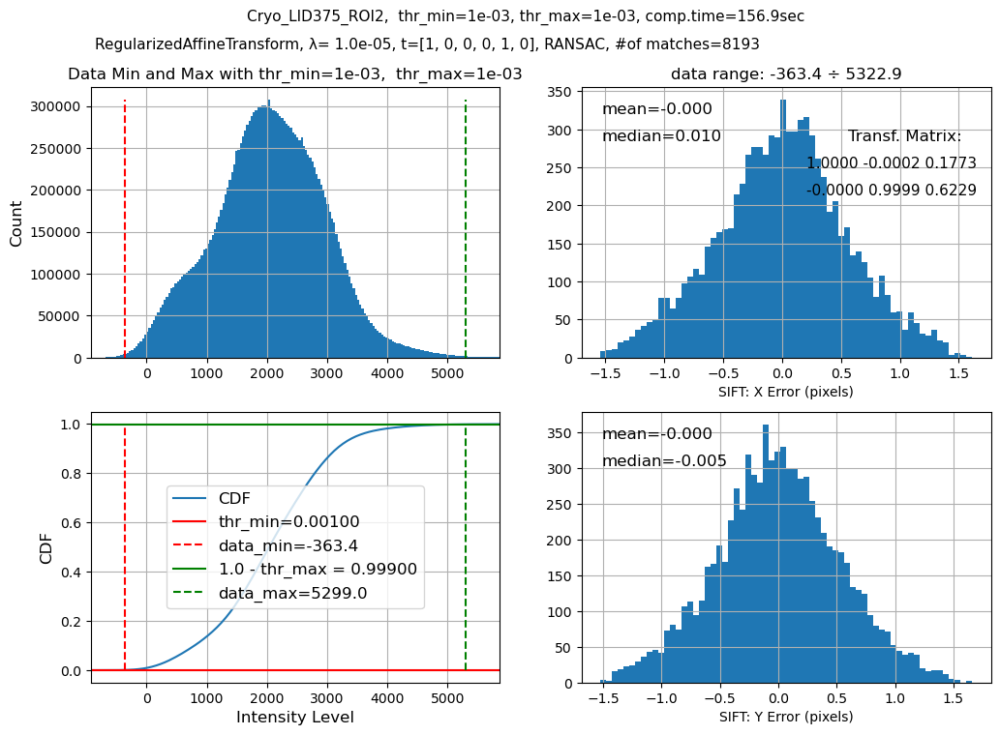

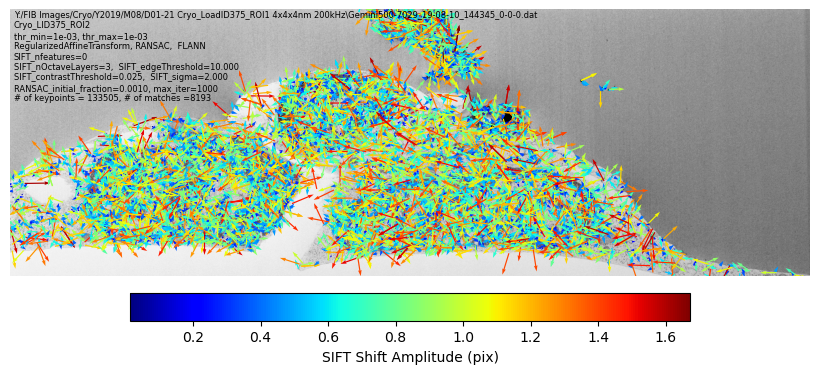

In [14]:
%%time
SIFT_evaluation_results = test_dataset.SIFT_evaluation()

# Step 1a. Evaluate Field Flatness and determine Correction Parameters

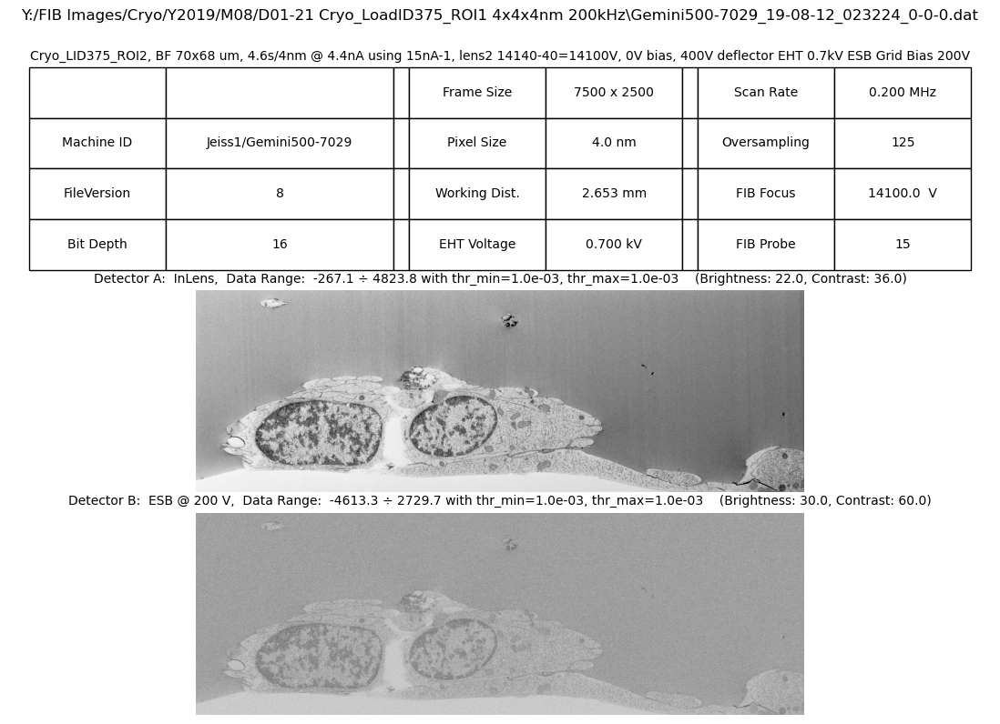

In [15]:
test_frame_ind = 9000
test_frame = FIBSEM_frame(fls[test_frame_ind])
test_frame.save_snapshot()

Estimator coefficients 1, x, y, x^2, x y, y^2 :  [ 0.00000000e+00  1.03698741e+00  5.82499660e+00  5.20388501e-04
 -1.06654931e-03 -1.14077094e-02]
Estimator intercept:  8363.49168095008
Estimator coefficients 1, x, y, x^2, x y, y^2 :  [ 0.00000000e+00  1.48270394e-01 -1.48685890e+00 -3.01682813e-04
 -4.55565802e-04  1.15268873e-02]
Estimator intercept:  4692.689376284798
Image Flattening Info saved into the binary file:  Y:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz/Results\Gemini500-7029_19-08-12_023224_0-0-0_flatfield_corr.bin


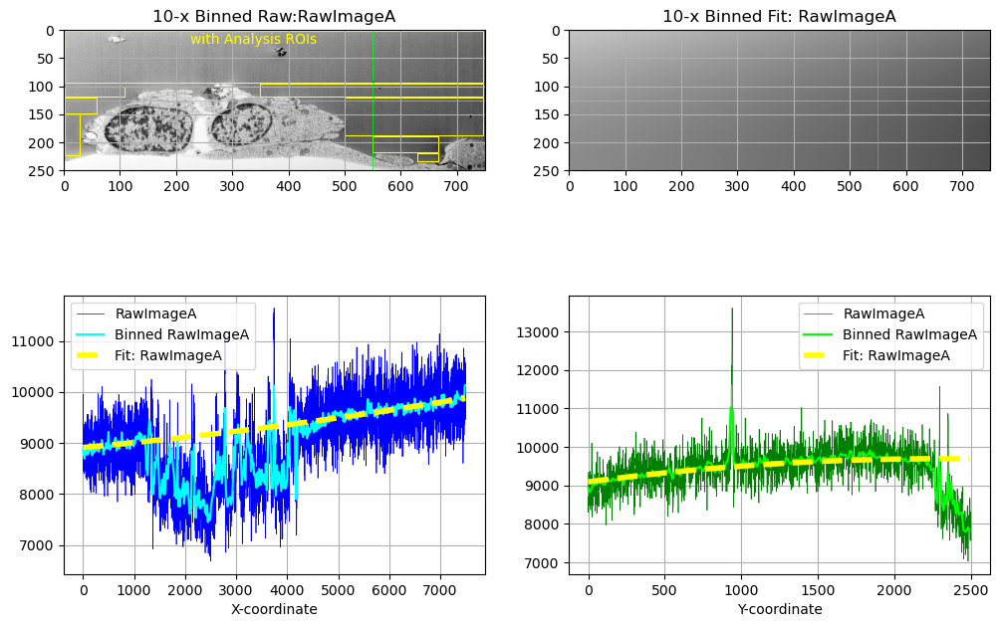

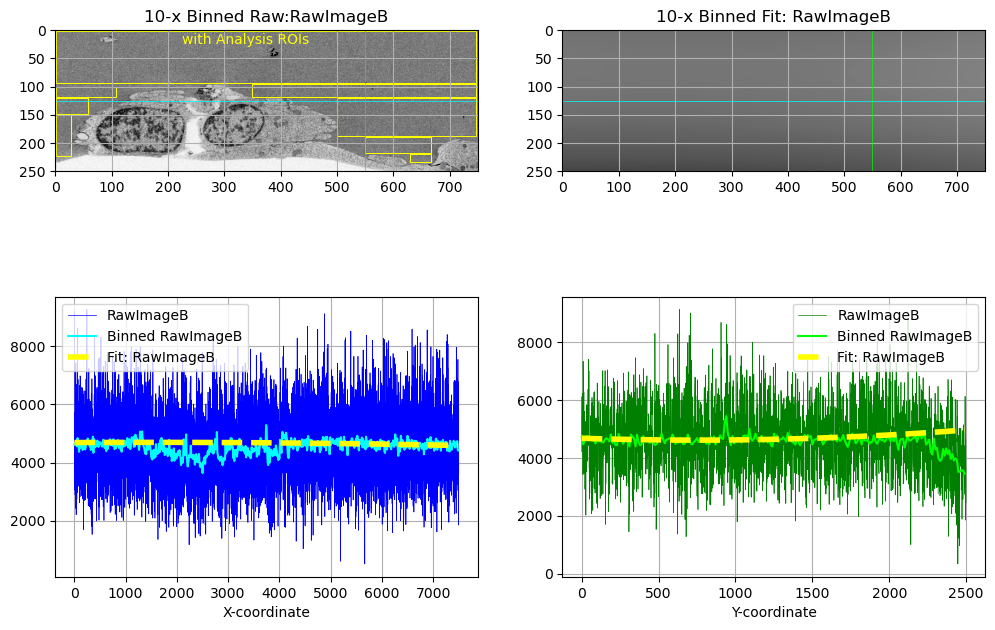

In [16]:
Analysis_ROIs=[[10, 7490, 10, 950],
               [10, 1100, 1000, 1200],
               [10, 600, 1201, 1500],
               [10, 300, 1501, 2250],
               [3500, 7490, 951, 1200],
               [5000, 7490, 1201, 1900],
              [5500, 6690, 1901, 2200],
              [6300, 6690, 2201, 2350]]

corr_fname_png = os.path.splitext(os.path.split(fls[test_frame_ind])[1])[0] + '_flatfield_corr.png'
res_fname = os.path.join(data_dir, corr_fname_png)
flattening_params = test_frame.determine_field_fattening_parameters(image_names = ['RawImageA', 'RawImageB'],
                                                                     estimator = RANSACRegressor(),
                                                                     #estimator = LinearRegression(),
                                                                     bins=10, Analysis_ROIs=Analysis_ROIs,
                                                                    Xsect = 5500,
                                                                     calc_corr=True, save_correction_binary=True,
                                                                   res_fname = res_fname)

# Step 1b. Test Image Correction (Flattening)

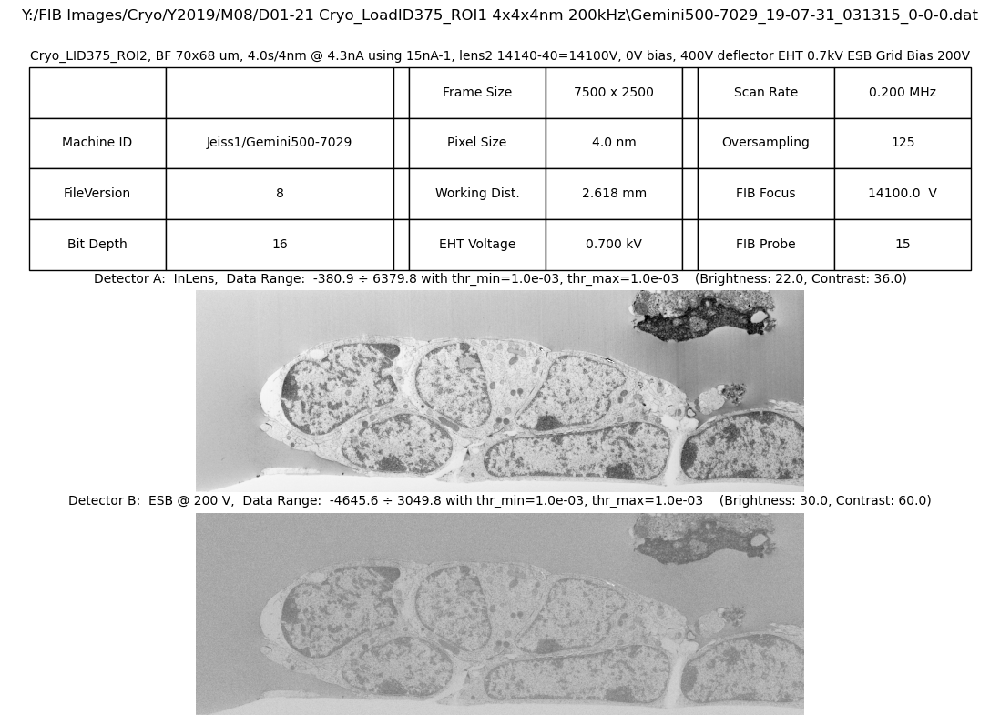

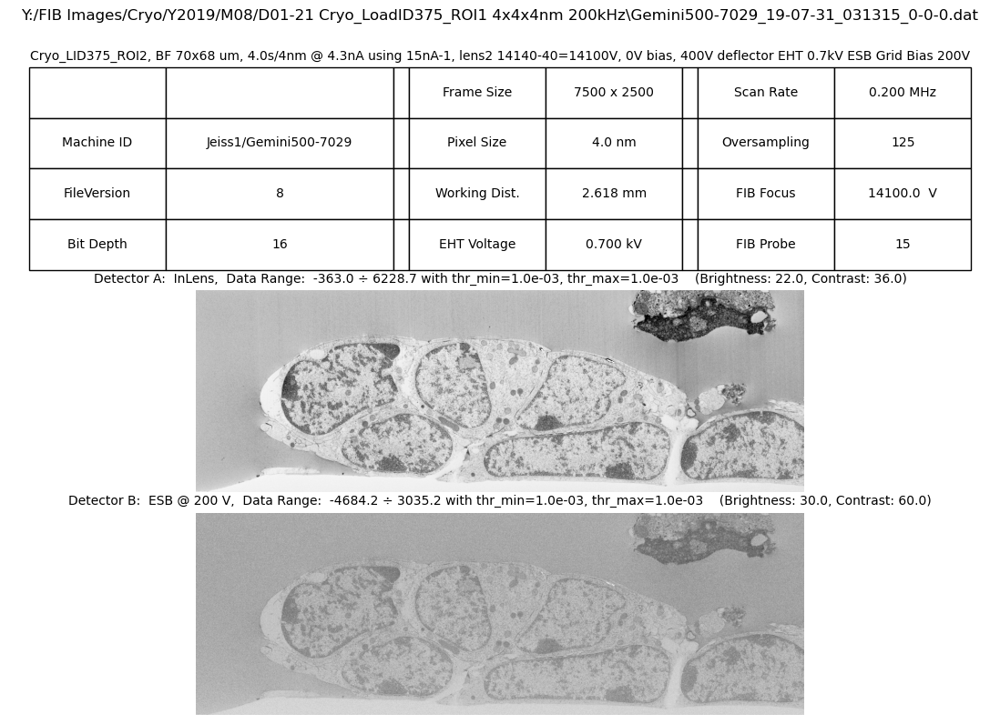

In [17]:
# test image correction
early_frame = FIBSEM_frame(fls[100])
early_frame.save_snapshot(snapshot_name = early_frame.fname.replace('.dat', '_original_snapshot.png'))
early_frame.RawImageA, early_frame.RawImageB = early_frame.flatten_image(image_correction_file = test_frame.image_correction_file)
early_frame.save_snapshot(snapshot_name = early_frame.fname.replace('.dat', '_flattened_snapshot.png'))

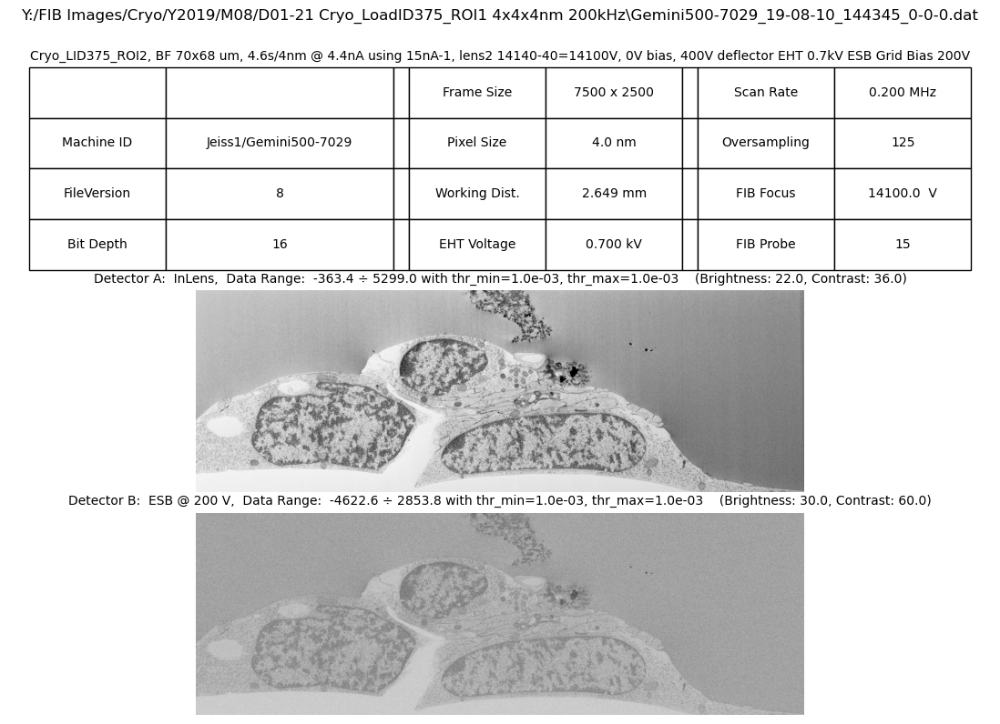

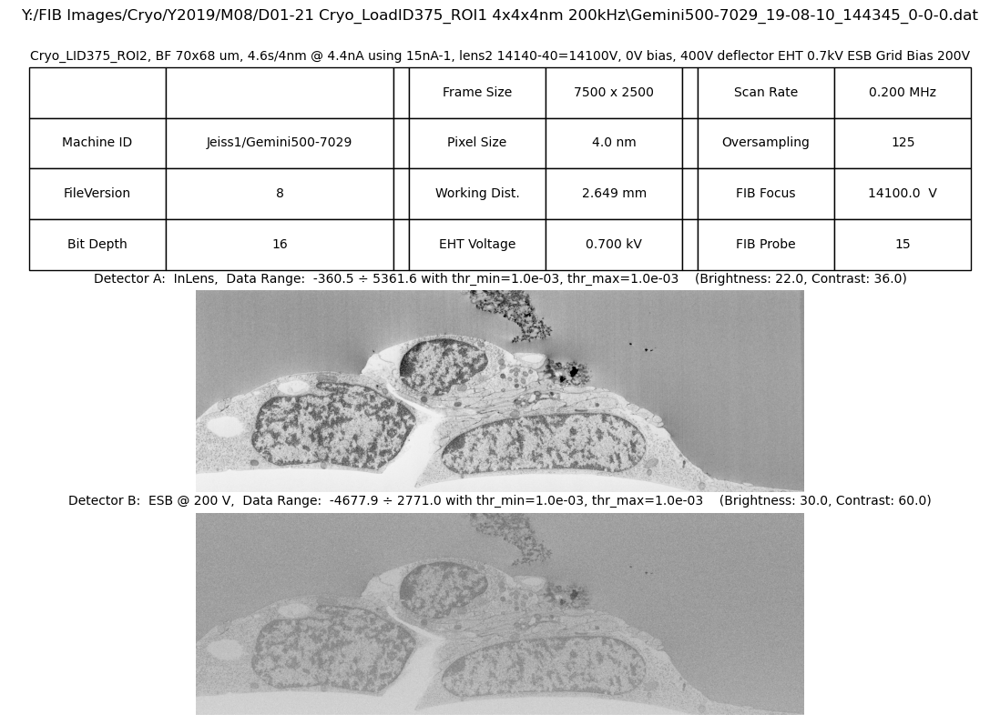

In [18]:
# test image correction
mid_frame = FIBSEM_frame(fls[len(fls)//2])
mid_frame.save_snapshot(snapshot_name = mid_frame.fname.replace('.dat', '_original_snapshot.png'))
mid_frame.RawImageA, mid_frame.RawImageB = mid_frame.flatten_image(image_correction_file = test_frame.image_correction_file)
mid_frame.save_snapshot(snapshot_name = mid_frame.fname.replace('.dat', '_flattened_snapshot.png'))

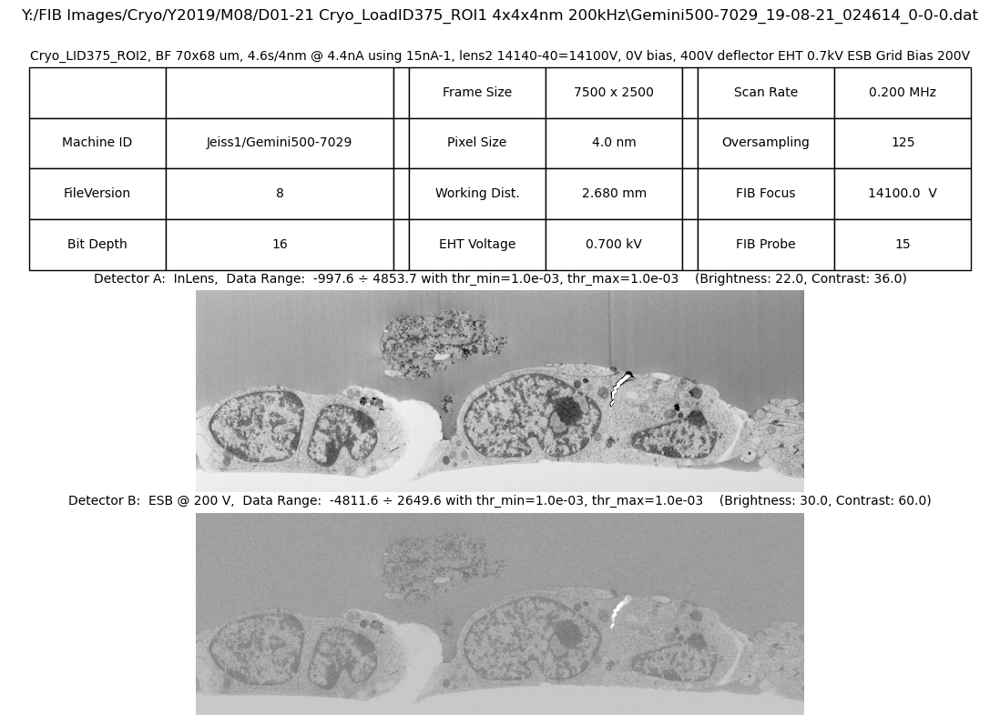

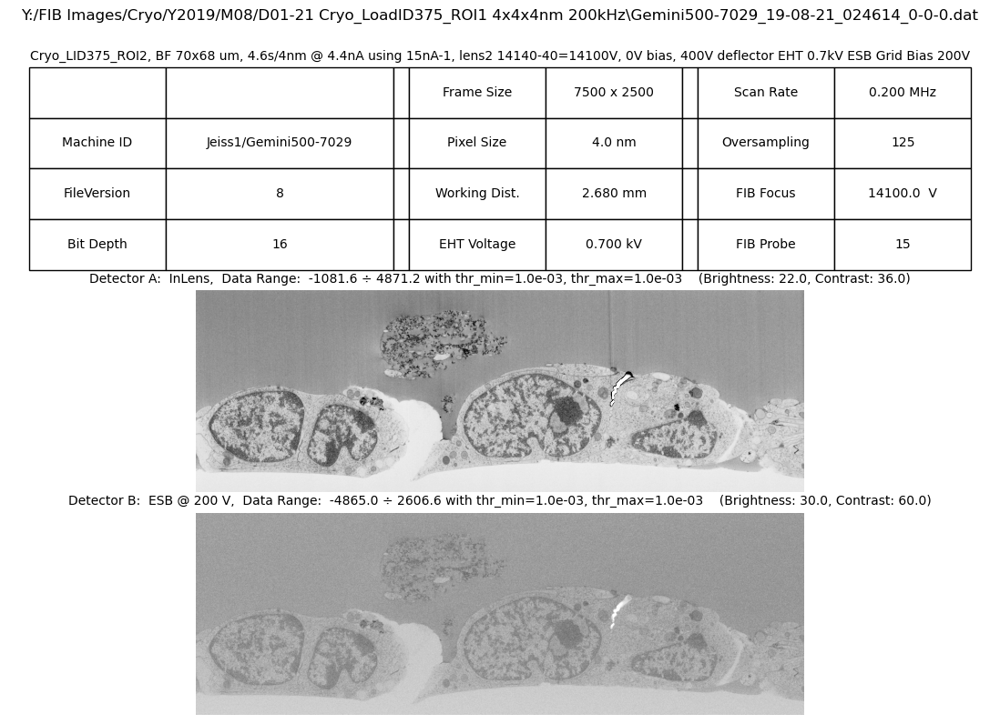

In [19]:
# test image correction
late_frame = FIBSEM_frame(fls[-100])
late_frame.save_snapshot(snapshot_name = late_frame.fname.replace('.dat', '_original_snapshot.png'))
late_frame.RawImageA, late_frame.RawImageB = late_frame.flatten_image(image_correction_file = test_frame.image_correction_file)
late_frame.save_snapshot(snapshot_name = late_frame.fname.replace('.dat', '_flattened_snapshot.png'))

In [20]:
# if all is good - assign the image correction file to the test_dataset object
test_dataset.image_correction_file = test_frame.image_correction_file

# This is where the data processing begins. Perform SIFT Computations using DASK Distributed (local cluster, using SCATTER, MAP and GATHER)

# Step 2a: Save InLens.tif Data (Optional)

In [21]:
if save_data_as_tiff:
    test_dataset.convert_raw_data_to_tif_files(client)

In [22]:
def evaluate_XMinMax_frame(params):
    fl, kwargs = params
    ftype = kwargs.get("ftype", 0)
    image_name = kwargs.get("image_name", 'RawImageA')
    thr_min = kwargs.get("threshold_min", 1e-3)
    thr_max = kwargs.get("threshold_max", 1e-3)
    nbins = kwargs.get("nbins", 256)
    try:
        frame = FIBSEM_frame(fl, ftype=ftype)
        Xmin = frame.Xmin
        Xmax = frame.Xmax
    except:
        Xmin = 0
        Xmax = 0
    return Xmin, Xmax

In [23]:
 params_s2 = [[fl, SIFT_kwargs] for fl in np.array(fls)]

In [24]:
futures = client.map(evaluate_XMinMax_frame, params_s2, retries = 3)
XminXMax = np.array(client.gather(futures))

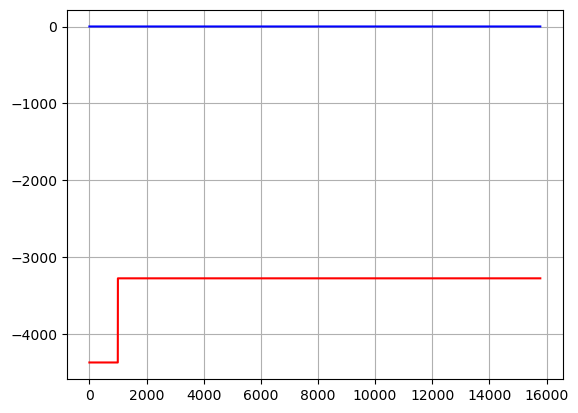

In [25]:
dX = (early_frame.Xmax-early_frame.Xmin)/early_frame.XResolution
xmn = XminXMax[:, 0] / dX
xmx = XminXMax[:, 1] / dX
plt.plot(xmn, 'r')
plt.plot((xmx-xmn)/early_frame.XResolution, 'b')
plt.grid(True)

# I was hoping that I can get the FOV trend data from the Xmin and Xmax data, I was wrong.
# will need to reconstruct the FOV data manually from the OneNote records

# Step 2b: Step 2b: Evaluate parameters of FIBSEM data set (Data Min/Max, Working Distance, Milling Y Voltage, FOV center positions)

DASK client exists. Will perform distributed computations
Use http://localhost:55341/status to monitor DASK progress
Evaluating the parameters of FIBSEM data set (data Min/Max, Working Distance, Milling Y Voltage, FOV center positions, Scan Rate, EHT)
2024/07/08  18:45:01   Using DASK distributed
Using fit_params:  SG 11 3
2024/07/08  19:47:19   Saving the FIBSEM dataset statistics (Min/Max, Mill Rate, FOV Shifts into the file:  Y:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\FIBSEM_Data.xlsx
Z pixel = 3.93 nm  - based on WD data
Z pixel = 3.67 nm  - based on Milling Voltage data
Using fit_params:  SG 11 3
Wall time: 1h 2min 43s
Wall time: 1h 2min 43s


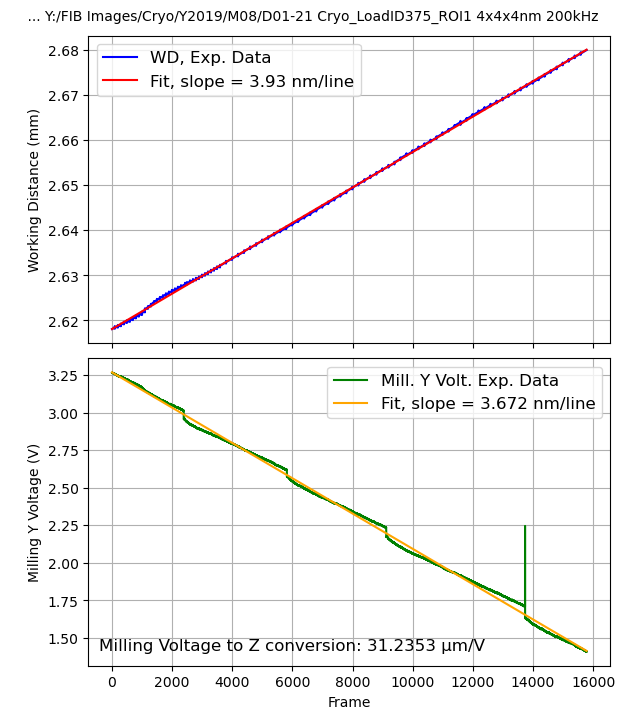

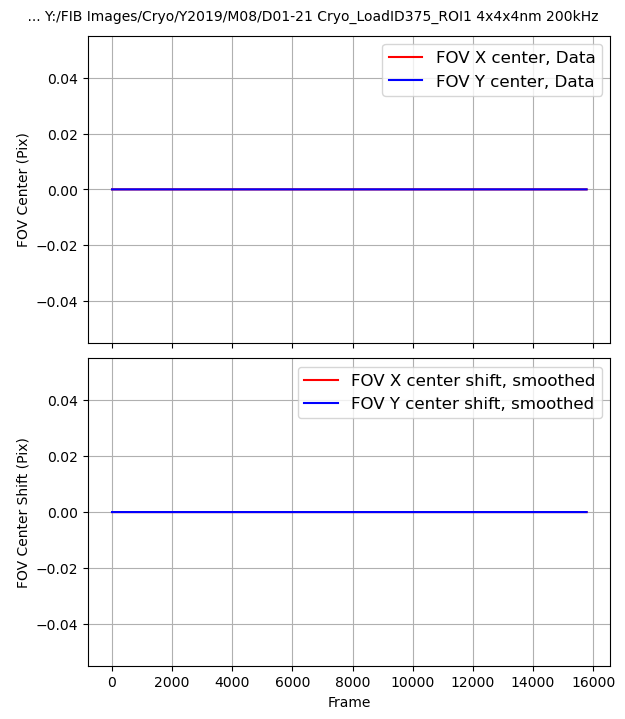

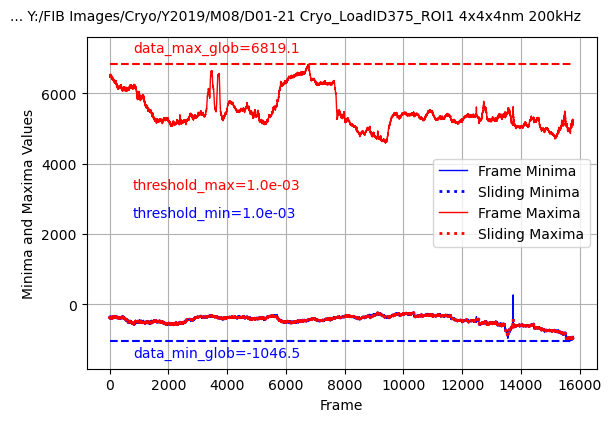

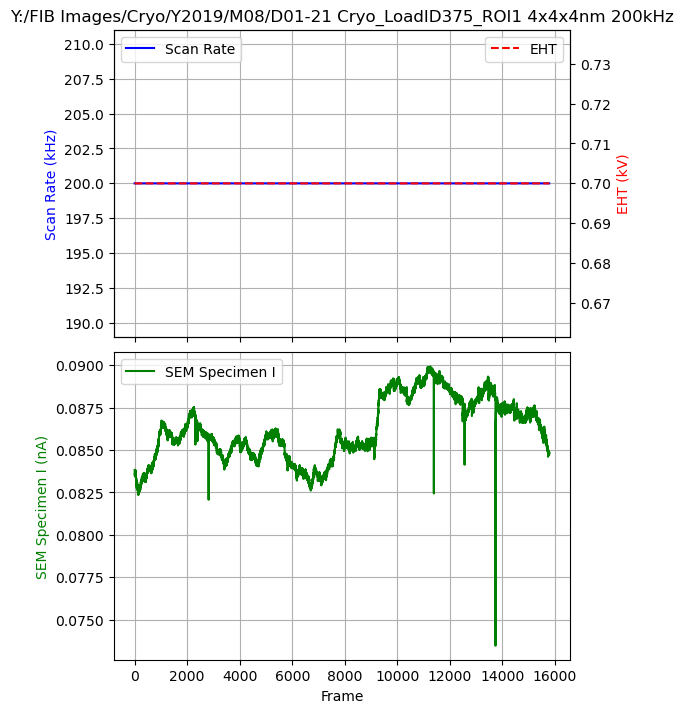

In [26]:
%%time
%%time
FIBSEM_Data = test_dataset.evaluate_FIBSEM_statistics(DASK_client = client,
                                                      fit_params = ['SG', 11, 3])
generate_report_mill_rate_xlsx(FIBSEM_Data[0])
generate_report_FOV_center_shift_xlsx(FIBSEM_Data[0])
generate_report_data_minmax_xlsx(FIBSEM_Data[0])
generate_report_ScanRate_EHT_xlsx(FIBSEM_Data[0])

# Steps 3 and 4: Extract Key Points and Descriptors, Find Matches and Transformations

In [ ]:
%%time
# Step 3: Extract Key Points and Descriptors using DASK Distributed
t1 = time.time()
print('Step 3: Extract Key Points and Descriptors')
fnms = test_dataset.extract_keypoints(DASK_client = client)   
t2 = time.time()
print('Step 3: Elapsed time: {:.2f} seconds'.format(t2 - t1))
print('')

# Step 4: Select good matches and extract transformation parameters using DASK Distributed
matcher_str = 'BF' if BFMatcher else 'FLANN'
print('Step 4: Select Good Matches with ' + matcher_str + ' matcher')
print('Step 4: using ' + test_dataset.TransformType.__name__ + ' Transformation Model with ' + solver + ' solver')
if TransformType == RegularizedAffineTransform:
    print('Step 4: ' + test_dataset.TransformType.__name__ + ' parameters:')
    print('Step 4: Regularization matrix: ')
    print(test_dataset.l2_matrix)
    print('Step 4: Target Solution: ', test_dataset.targ_vector)

results_s4 = test_dataset.determine_transformations(client)
t3 = time.time()
print('Step 4: Elapsed time: {:.2f} seconds'.format(t3 - t2))

tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix()
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

Step 3: Extract Key Points and Descriptors
DASK client exists. Will perform distributed computations
Use http://localhost:55341/status to monitor DASK progress
2024/07/09  10:52:42   Using DASK distributed


# This data was taken when the File Version was still at 8 - so FOV shift data was not stored in the headers. Need to reconctruct it manually from One Note

In [104]:
FOV_notes_trends_xlsx = os.path.normpath('Z:\FIB Images\Cryo\Y2019\M08\D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\LID375_ROI1b_FOV_shifts.xlsx')
FOV_notes_trends = pd.read_excel(FOV_notes_trends_xlsx)
FOV_notes_trends.head()

,Date,Time,Frame,ID,Xshift set,Yshift set,Comments
0,2019-07-31,04:45:00,Gemini500-7029_19-07-31_034405_0-0-0.dat,116,-1.0,1.0,NaN
1,NaT,07:10:00,Gemini500-7029_19-07-31_060841_0-0-0.dat,191,-1.0,0.0,NaN
2,NaT,09:48:00,Gemini500-7029_19-07-31_084654_0-0-0.dat,273,-1.0,-1.0,NaN
3,NaT,16:01:00,Gemini500-7029_19-07-31_145957_0-0-0.dat,466,-1.0,0.0,NaN
4,2019-08-01,05:30:00,Gemini500-7029_19-08-01_042923_0-0-0.dat,884,-1.0,0.5,NaN


In [105]:
fls_bare = [os.path.split(fl)[-1] for fl in fls]
event_frames = FOV_notes_trends['Frame']
ids = [fls_bare.index(event_frame) for event_frame in event_frames]

In [106]:
Xshifts = np.zeros(len(fls))
Yshifts = np.zeros(len(fls))
Xshift_set = FOV_notes_trends['Xshift set']
Yshift_set = FOV_notes_trends['Yshift set']
event_ids = FOV_notes_trends['ID']

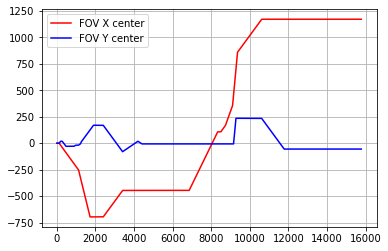

In [107]:
for j, even_id in enumerate(event_ids[:-1]):
    Xshifts[event_ids[j]:event_ids[j+1]] = Xshift_set[j]
    Yshifts[event_ids[j]:event_ids[j+1]] = Yshift_set[j]

XFOV_center = np.cumsum(Xshifts)/4.0
YFOV_center = np.cumsum(Yshifts)/4.0
plt.plot(XFOV_center, 'r', label='FOV X center')
plt.plot(YFOV_center, 'b', label='FOV Y center')
plt.plt.grid(True)
plt.legend()

In [108]:
FIBSEM_Data_mod = np.array(FIBSEM_Data)
FIBSEM_Data_mod[7] = XFOV_center
FIBSEM_Data_mod[8] = YFOV_center
sv_apert = np.min((51, len(test_dataset.FIBSEM_Data[7])//8*2+1))
test_dataset.FOVtrend_x = savgol_filter(test_dataset.FIBSEM_Data[7]*1.0, sv_apert, 1) - test_dataset.FIBSEM_Data[7][0]
test_dataset.FOVtrend_y = savgol_filter(test_dataset.FIBSEM_Data[8]*1.0, sv_apert, 1) - test_dataset.FIBSEM_Data[8][0]

C:\Users\labadmin\AppData\Local\Temp/ipykernel_14564/1031295430.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  FIBSEM_Data_mod = np.array(FIBSEM_Data)


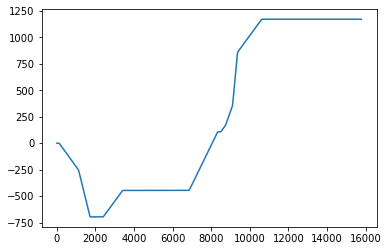

In [109]:
test_dataset.FIBSEM_Data = FIBSEM_Data_mod
plt.plot(test_dataset.FOVtrend_x)

Calculating Cummilative Transformation Matrix:   0%|          | 0/15781 [00:00<?, ?it/s]

Recalculating the shifts for preserved scales:   0%|          | 0/15781 [00:00<?, ?it/s]

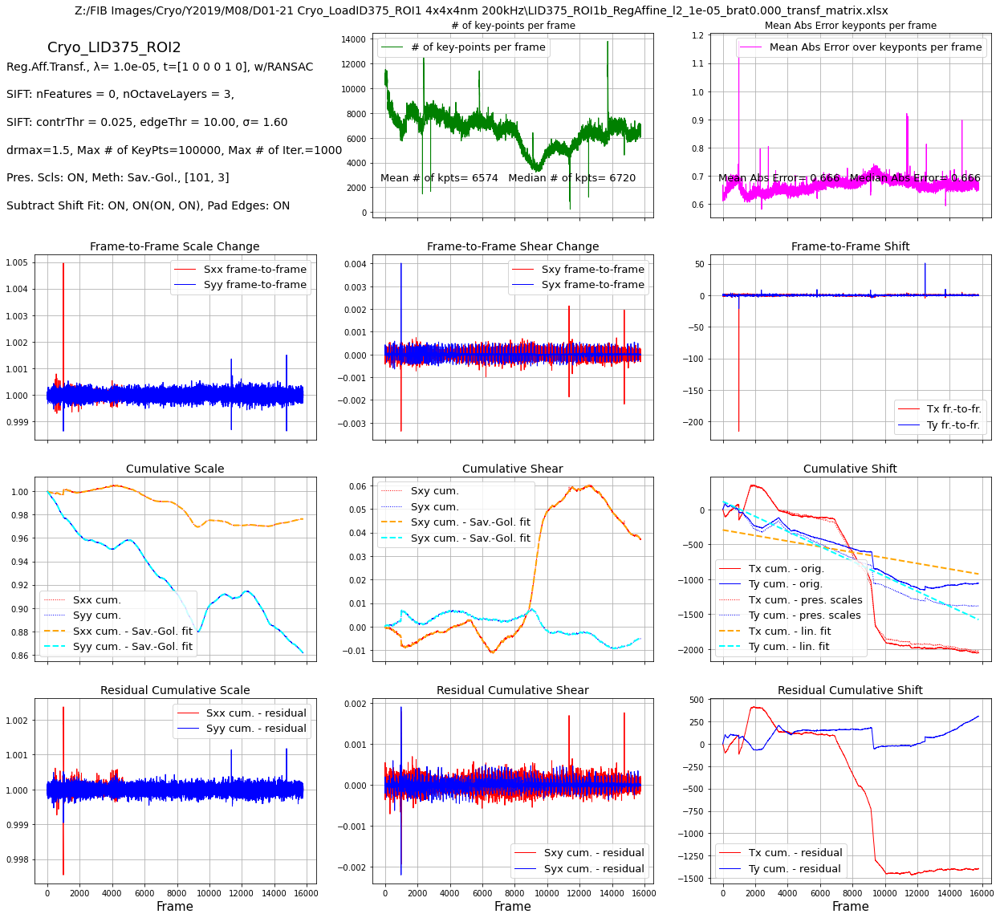

In [110]:
tr_matr_cum_residual, tr_matr_cum_xlsx_file = test_dataset.process_transformation_matrix(subtract_linear_fit = [True, True],
                                                                                        subtract_FOVtrend_from_fit = [True, True])
generate_report_transf_matrix_from_xlsx(tr_matr_cum_xlsx_file)

In [111]:
# here is an example of how the previous step can be modified easily without having to re-do all previous steps
# this will calculate the cumulative transformation matrix WITHOT modifying the object property subtract_linear_fit
# so this change will NOT propagate.
# tr_matr_cum_residual = test_dataset.process_transformation_matrix(subtract_linear_fit = [False, True])

# if you want to make permanet change, then you should do this:
# test_dataset.subtract_linear_fit = [False, True]
# tr_matr_cum_residual = test_dataset.process_transformation_matrix()


# Step 5: Search for frames with no (or low # of) matches and possibly remove them.

In [112]:
thr_npt = 3   # consider frame with less than 3 Key Points for removal
tr_matr_cum_residual = test_dataset.check_for_nomatch_frames(thr_npt, **SIFT_kwargs)

Frames with no matches to the next frame:   []
Frames to remove:   []
No frames selected for removal


# Step 6: Recall or Save the Intermediate Data (KeyPoints, Matches, Transf.Matrix, etc.) from / into spreadsheets and a binary files.  Remove the intermediate KeyPoint/Descriptor files.

In [4]:
recall_the_data = True          # if False, the data will be saved. if True, the data will be recalled

dump_filename = os.path.join(data_dir, test_dataset.fnm_reg.replace('.mrc', '_params.bin'))

if recall_the_data:
    test_dataset = FIBSEM_dataset(fls, recall_parameters=True, dump_filename=dump_filename, **SIFT_kwargs)
else:
    saved_dump_file = test_dataset.save_parameters(dump_file=dump_filename)
    print('Parameters saved into the file: ', saved_dump_file)

Total Number of frames:  15782
Registered data will be saved into:  Registered_I16_RegularizedAffineTransform_RANSAC_drmax1.5_const_scls_SG_shift_subtr_padded_l2_1e-05.mrc


Recalling the data set parameters:   0%|          | 0/60 [00:00<?, ?it/s]

In [114]:
remove_key_points_data = False   # if True, the binary files with intermediate keypoints data for each frame will be removed

# Remove temporary files
if remove_key_points_data:
    # Remove the keypoint/ descriptor files
    for fnm in tqdm(fnms, desc='Removing KeyPoint/Descriptor Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass
    for fnm in tqdm(fnms_matches, desc='Removing Matched KeyPoint Files: '):
        try:
            os.remove(os.path.join(data_dir, fnm))
        except:
            pass

# Define Evaluation Box. Then Evaluate Image B fraction for fused image using Auto-Correlation and Cross-Correlation

When estimating SNR based on Auto-Correlation it is important to NOT transform the data.

Transforming the data involved interpolation which changes (usually increases) SNR.

So the evaluation_box for this purpose should be used with kwarg perform_transformation=False.

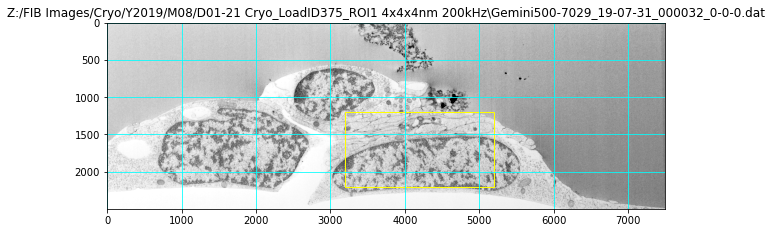

In [8]:
#evaluation_box = [250, 2000, 1450, 2650]      # optional evaluation box for defining the area over which the registration quality
#test_dataset.show_eval_box(evaluation_box = evaluation_box, invert_data=False)
#
# default frames are three frames: 10% from the start, 50% from the start, and 90% from the start
# alternatively you can set any list of frame indecis by using keyword frame_indices
# for example:0
# test_dataset.show_eval_box(frame_indices=[1, 100, 850], evaluation_box = evaluation_box, invert_data=False)
#
evaluation_box = [1200, 1000, 3200, 2000] 
test_dataset.show_eval_box(invert_data=False, frame_inds=[len(fls)//2],
                           evaluation_box=evaluation_box,
                          perform_transformation=False)

Analyzing Auto-Correlation SNRs :   0%|          | 0/1 [00:00<?, ?it/s]

Re-analyzing Auto-Correlation SNRs for fused image:   0%|          | 0/1 [00:00<?, ?it/s]

(0.020001040072329744, 0.015866960230887635, 0.017552624371674302)

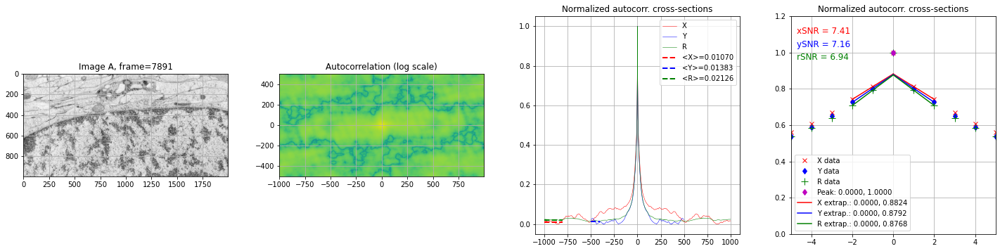

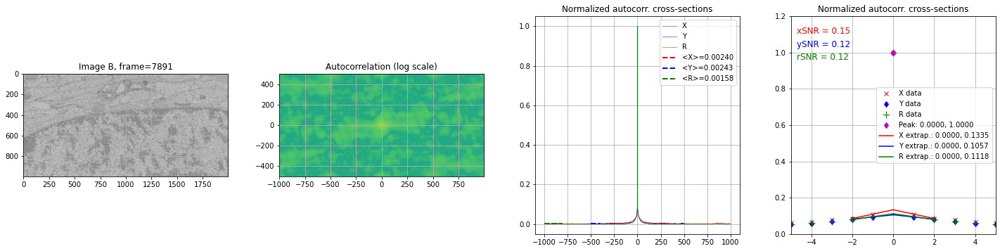

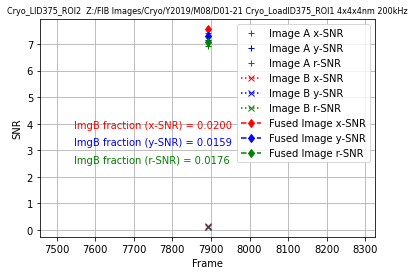

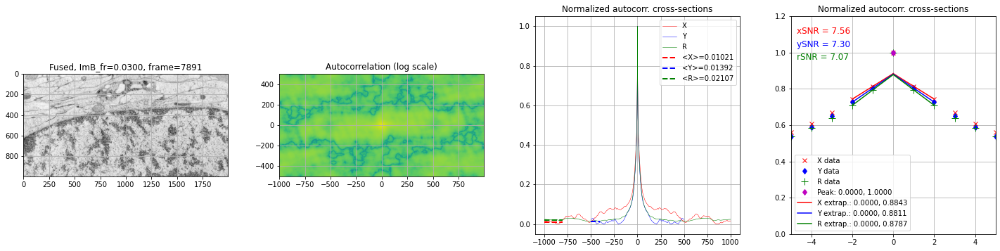

In [12]:
test_dataset.estimate_SNRs(frame_inds=[len(fls)//2],
                           evaluation_box = evaluation_box,
                           perform_transformation=False,
                          ImgB_fraction = 0.03)

Evaluating Img B fractions:   0%|          | 0/6 [00:00<?, ?it/s]

Wall time: 1min 1s


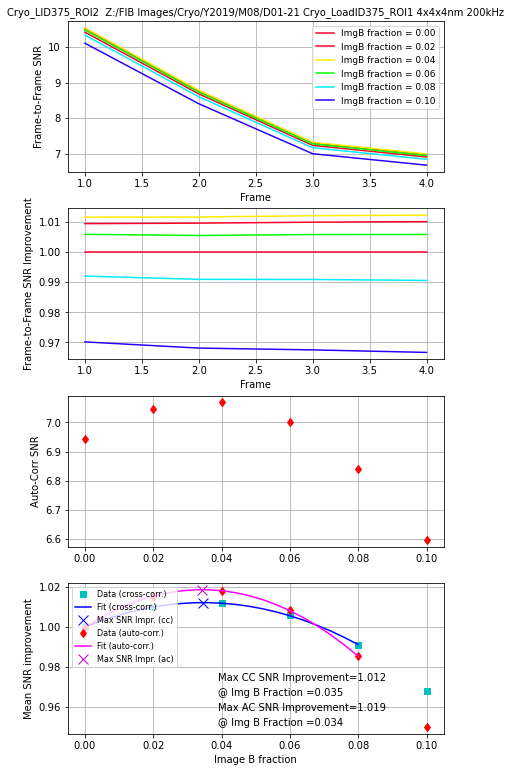

In [10]:
%%time
frame_inds = np.arange(5) + len(test_dataset.fls)//2
ImgB_fractions = np.linspace(0, 0.10, 6)
ImgB_fr_optimal_mid = test_dataset.evaluate_ImgB_fractions(ImgB_fractions,
                                                           frame_inds,
                                                           evaluation_box = evaluation_box,
                                                           DASK_client=client, use_DASK=True)

# Define Evaluation Box for evaluating the Final Registration

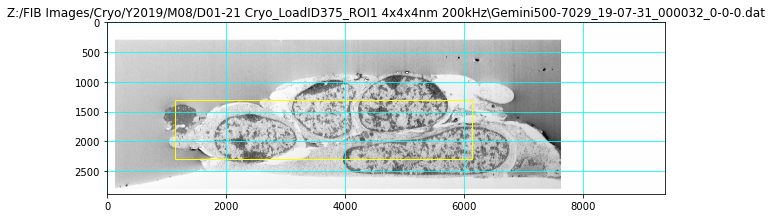

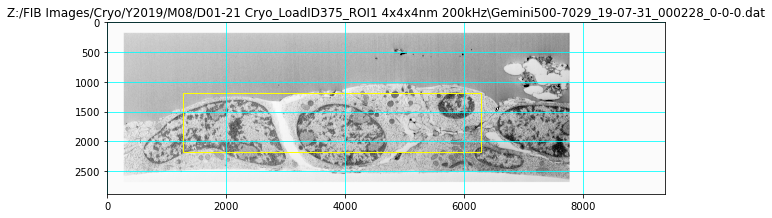

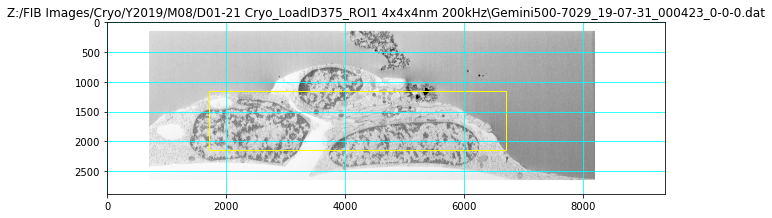

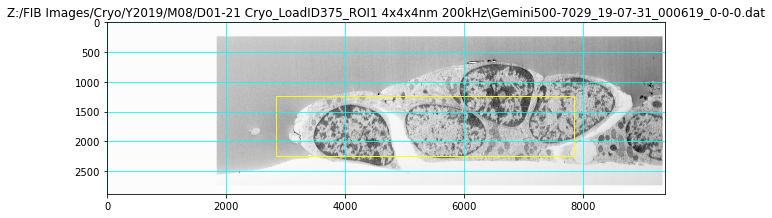

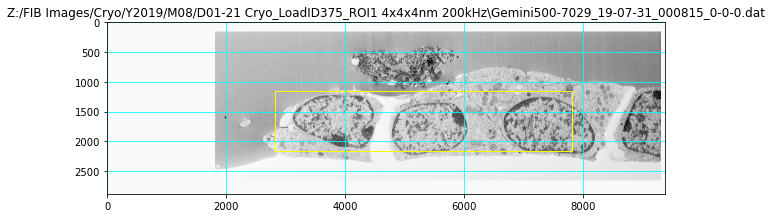

In [117]:
#evaluation_box = [250, 2000, 1450, 2650]      # optional evaluation box for defining the area over which the registration quality
#test_dataset.show_eval_box(evaluation_box = evaluation_box, invert_data=False)
#
# default frames are three frames: 10% from the start, 50% from the start, and 90% from the start
# alternatively you can set any list of frame indecis by using keyword frame_indices
# for example:0
# test_dataset.show_eval_box(frame_indices=[1, 100, 850], evaluation_box = evaluation_box, invert_data=False)
#
evaluation_box = [1000, 1000, 1000, 5000]
test_dataset.show_eval_box(invert_data=False, frame_inds=[nfrs//10, nfrs//4, nfrs//2, nfrs//5*4, nfrs//10*9],
                           evaluation_box=evaluation_box,
                            sliding_evaluation_box = False)

# Step 7: Transform and Save the FIB-SEM data

Step 7: Transform and Save the FIB-SEM data
Transforming and Saving Intermediate Registered Frames
Transform and Save Chunks of Frames: Starting DASK jobs


tornado.application - ERROR - Uncaught exception GET /status/ws (::1)
HTTPServerRequest(protocol='http', host='localhost:51294', method='GET', uri='/status/ws', version='HTTP/1.1', remote_ip='::1')
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\tornado\websocket.py", line 954, in _accept_connection
    open_result = handler.open(*handler.open_args, **handler.open_kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\tornado\web.py", line 3173, in wrapper
    return method(self, *args, **kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\bokeh\server\views\ws.py", line 149, in open
    raise ProtocolError("Token is expired.")
bokeh.protocol.exceptions.ProtocolError: Token is expired.


Finished DASK jobs
Analyzing Registration Quality
Analyzing Frame Registration: Starting DASK jobs
Finished DASK jobs
Saving the Registration Quality Statistics into the file:  Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\LID375_ROI1b_RegAffine_l2_1e-05_brat0.060_flattened_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=9383, ny=2881, nz=15782,  data type: <class 'numpy.int16'>
Voxel Size (nm): 3.999928 x 3.999928 x 3.928896
Saving dataset into MRC file:  Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\LID375_ROI1b_RegAffine_l2_1e-05_brat0.060_flattened.mrc


Saving Frames into MRC File:   0%|          | 0/15782 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/15782 [00:00<?, ?it/s]

Wall time: 14h 1min 8s


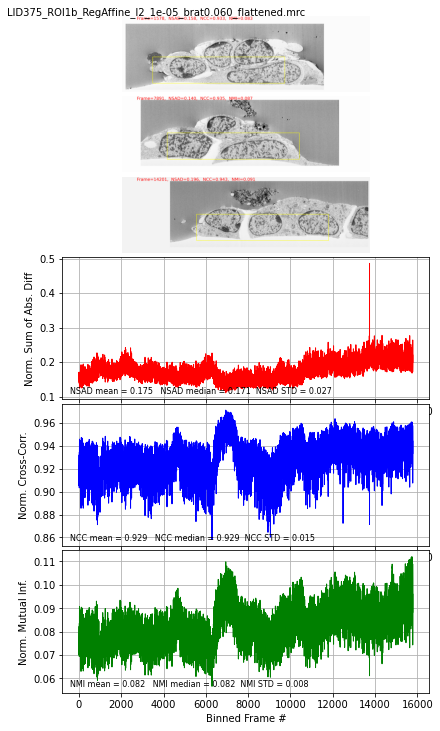

In [118]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_flattened.mrc'

evaluation_box = [1250, 1000, 1000, 5000]

reg_summary_RegAffine_ImB0p030_flat, reg_summary_RegAffine_ImB0p030_flat_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        flatten_image = True,
                                                        save_transformed_dataset = True,
                                                        save_registration_summary = True,
                                                        ImgB_fraction=0.030,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p030_flat_xlsx)

# Crop the data to reduce size

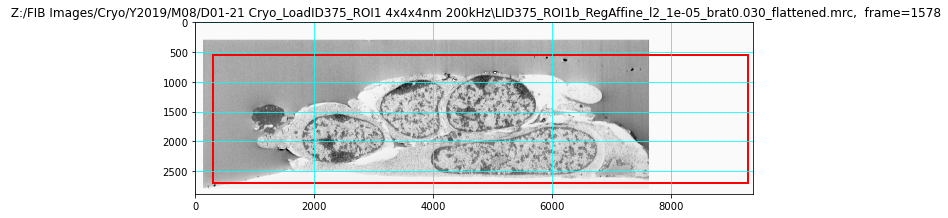

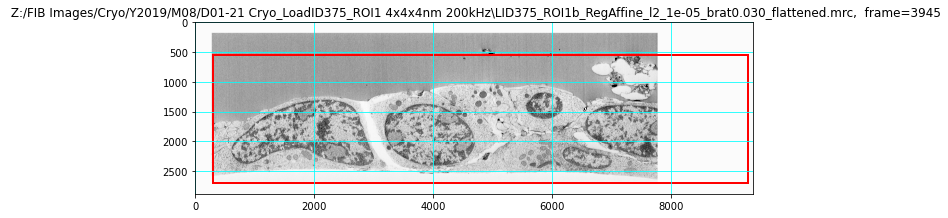

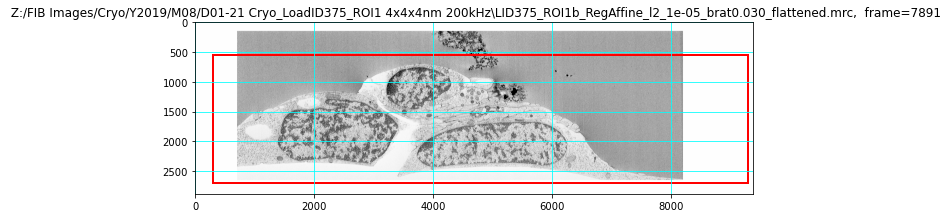

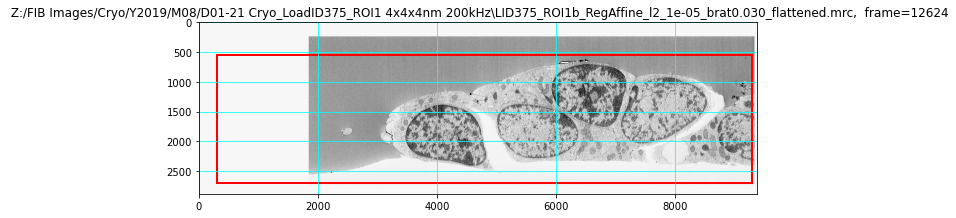

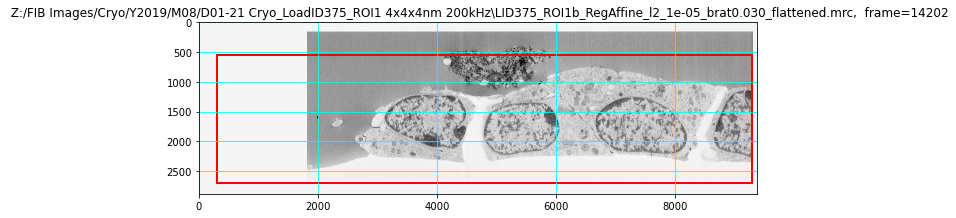

In [19]:
full_mrc_stack = 'Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_flattened.mrc'
evaluation_box = [550, 2150, 300, 9000]

show_eval_box_mrc_stack(full_mrc_stack,
                        frame_inds=[nfrs//10, nfrs//4, nfrs//2, nfrs//5*4, nfrs//10*9],
                        evaluation_box = evaluation_box,
                        sliding_evaluation_box = False, box_color='red', box_linewidth=2)

In [38]:
cropped_binned16nm_mrc_stack = full_mrc_stack.replace('.mrc', '_cropped_16x16x16nm.mrc')
bin_crop_mrc_stack(full_mrc_stack,
                   binned_copped_filename  = cropped_binned16nm_mrc_stack,
                   DASK_client = client,
                  xbin_factor=4,
                  ybin_factor=4,
                  zbin_factor=4,
                  xi = 250,
                  xa = 9300,
                  yi = 550,
                  ya = 2700)

Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 39.288963
Result mrc_mode: 1, source data type: <class 'numpy.int16'>
New Data Set Shape:  2262 x 537 x 3946
Result Voxel Size (Angstroms): 159.997116 x 159.997116 x 157.155853


Saving the data stack into MRC file:   0%|          | 0/3946 [00:00<?, ?it/s]

['Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\\LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_flattened_cropped_16x16x16nm.mrc']

In [39]:
cropped_mrc_stack = full_mrc_stack.replace('.mrc', '_cropped.mrc')
bin_crop_mrc_stack(full_mrc_stack,
                   binned_copped_filename  = cropped_mrc_stack,
                   DASK_client = client,
                  xbin_factor=1,
                  ybin_factor=1,
                  zbin_factor=1,
                  xi = 250,
                  xa = 9300,
                  yi = 550,
                  ya = 2700)

Source mrc_mode: 1, source data type: <class 'numpy.int16'>
Source Voxel Size (Angstroms): 39.999279 x 39.999279 x 39.288963
Result mrc_mode: 1, source data type: <class 'numpy.int16'>
New Data Set Shape:  9050 x 2150 x 15782
Result Voxel Size (Angstroms): 39.999279 x 39.999279 x 39.288963


Saving the data stack into MRC file:   0%|          | 0/15782 [00:00<?, ?it/s]

C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:3419: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
C:\ProgramData\Anaconda3\lib\site-packages\numpy\core\_methods.py:180: RuntimeWarning: invalid value encountered in true_divide
  ret = um.true_divide(


['Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\\LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_flattened_cropped.mrc']

tornado.application - ERROR - Uncaught exception GET /status/ws (::1)
HTTPServerRequest(protocol='http', host='localhost:62421', method='GET', uri='/status/ws', version='HTTP/1.1', remote_ip='::1')
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\tornado\websocket.py", line 954, in _accept_connection
    open_result = handler.open(*handler.open_args, **handler.open_kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\tornado\web.py", line 3173, in wrapper
    return method(self, *args, **kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\bokeh\server\views\ws.py", line 149, in open
    raise ProtocolError("Token is expired.")
bokeh.protocol.exceptions.ProtocolError: Token is expired.


Step 7: Transform and Save the FIB-SEM data
Transforming and Saving Intermediate Registered Frames
Transform and Save Chunks of Frames: Starting DASK jobs
Finished DASK jobs
Analyzing Registration Quality
Analyzing Frame Registration: Starting DASK jobs


tornado.application - ERROR - Uncaught exception GET /status/ws (::1)
HTTPServerRequest(protocol='http', host='localhost:51294', method='GET', uri='/status/ws', version='HTTP/1.1', remote_ip='::1')
Traceback (most recent call last):
  File "C:\ProgramData\Anaconda3\lib\site-packages\tornado\websocket.py", line 954, in _accept_connection
    open_result = handler.open(*handler.open_args, **handler.open_kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\tornado\web.py", line 3173, in wrapper
    return method(self, *args, **kwargs)
  File "C:\ProgramData\Anaconda3\lib\site-packages\bokeh\server\views\ws.py", line 149, in open
    raise ProtocolError("Token is expired.")
bokeh.protocol.exceptions.ProtocolError: Token is expired.


Finished DASK jobs
Saving the Registration Quality Statistics into the file:  Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_RegistrationQuality.xlsx
Creating Dask Array Stack
The resulting stack shape will be  nx=9383, ny=2881, nz=15782,  data type: <class 'numpy.int16'>
Voxel Size (nm): 3.999928 x 3.999928 x 3.928896
Saving dataset into MRC file:  Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\LID375_ROI1b_RegAffine_l2_1e-05_brat0.030.mrc


Saving Frames into MRC File:   0%|          | 0/15782 [00:00<?, ?it/s]

Removing Intermediate Registered Frame Files:   0%|          | 0/15782 [00:00<?, ?it/s]

Wall time: 14h 17min 59s


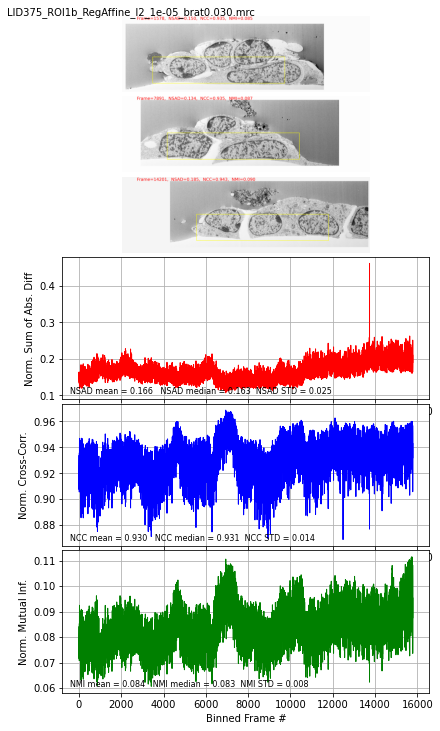

In [127]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID375_ROI1b_RegAffine_l2_1e-05_brat0.030.mrc'

evaluation_box = [1250, 1000, 1000, 5000]

reg_summary_RegAffine_ImB0p030_flat, reg_summary_RegAffine_ImB0p030_flat_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        flatten_image = False,
                                                        save_transformed_dataset = True,
                                                        save_registration_summary = True,
                                                        ImgB_fraction=0.030,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p030_flat_xlsx)

Step 7: Transform and Save the FIB-SEM data
Transforming and Saving Intermediate Registered Frames
Transform and Save Chunks of Frames: Starting DASK jobs
Finished DASK jobs
Analyzing Registration Quality
Analyzing Frame Registration: Starting DASK jobs
Finished DASK jobs
Saving the Registration Quality Statistics into the file:  Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\LID375_ROI1b_RegAffine_l2_1e-05_brat0.00_RegistrationQuality.xlsx
Registered data set is NOT saved into a file


Removing Intermediate Registered Frame Files:   0%|          | 0/15782 [00:00<?, ?it/s]

Wall time: 2h 39min 27s


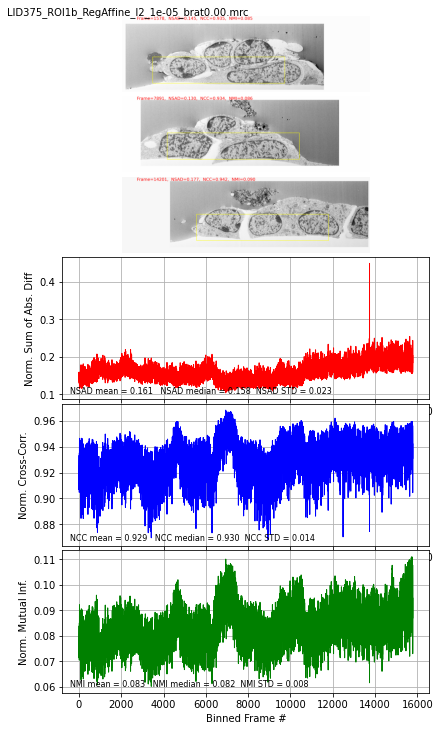

In [128]:
%%time

print('Step 7: Transform and Save the FIB-SEM data')

test_dataset.fnm_reg = 'LID375_ROI1b_RegAffine_l2_1e-05_brat0.00.mrc'

evaluation_box = [1250, 1000, 1000, 5000]

reg_summary_RegAffine_ImB0p00_flat, reg_summary_RegAffine_ImB0p00_flat_xlsx = test_dataset.transform_and_save(DASK_client = client,
                                                        flatten_image = False,
                                                        save_transformed_dataset = False,
                                                        save_registration_summary = True,
                                                        ImgB_fraction=0.00,
                                                        add_offset = True,
                                                        zbin_factor = 1,
                                                        evaluation_box = evaluation_box,
                                                        sliding_evaluation_box = False,
                                                        fnm_types = ['mrc'])

generate_report_from_xls_registration_summary(reg_summary_RegAffine_ImB0p00_flat_xlsx)

# Analyze Previous Registrations

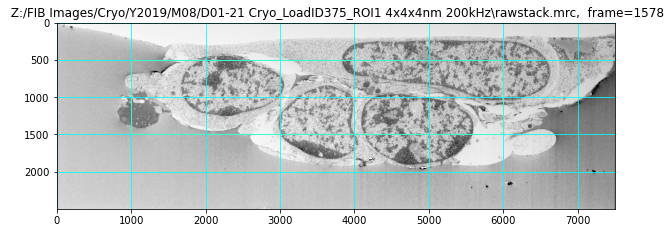

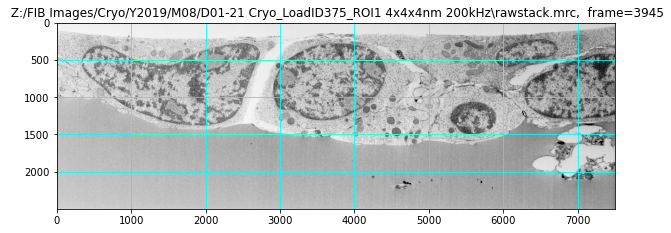

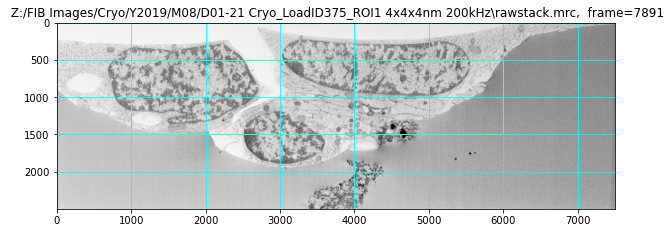

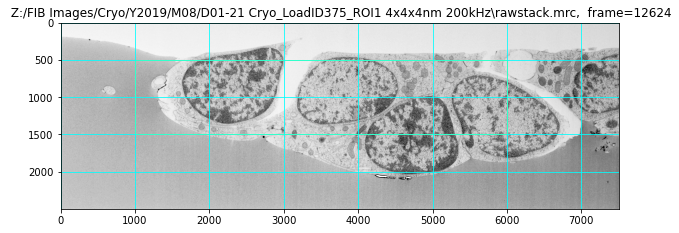

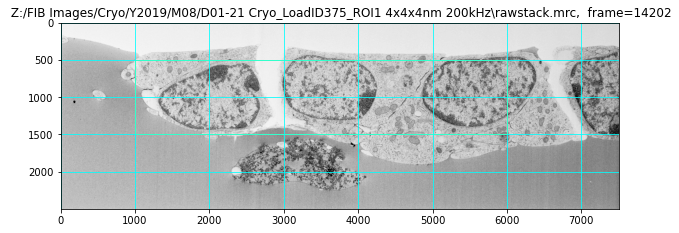

In [132]:
data_dir = 'Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz'
raw_stack_mrc = os.path.join(data_dir, 'rawstack.mrc')

evaluation_box = [500, 1000, 1000, 5000]
start_evaluation_box = [500, 1000, 1000, 5000]
stop_evaluation_box = [500, 1000, 1000, 5000] 

show_eval_box_mrc_stack(raw_stack_mrc, frame_inds=[nfrs//10, nfrs//4, nfrs//2, nfrs//5*4, nfrs//10*9],
                        evaluation_box = evaluation_box,
                       start_evaluation_box = start_evaluation_box,
                       stop_evaluation_box = stop_evaluation_box,
                       sliding_evaluation_box = True)

Will use sliding (linearly) evaluation box
   Starting with box:   [500, 1000, 1000, 5000]
   Finishing with box:  [500, 1000, 1000, 5000]
mrc_mode=6  , dt_mrc= <class 'numpy.uint16'>
Will analyze regstrations in 15784 frames
Will save the data into Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\rawstack_RegistrationQuality.xlsx
Using DASK distributed
Saving the Registration Quality Statistics into the file:  Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\rawstack_RegistrationQuality.xlsx
Wall time: 25min 37s


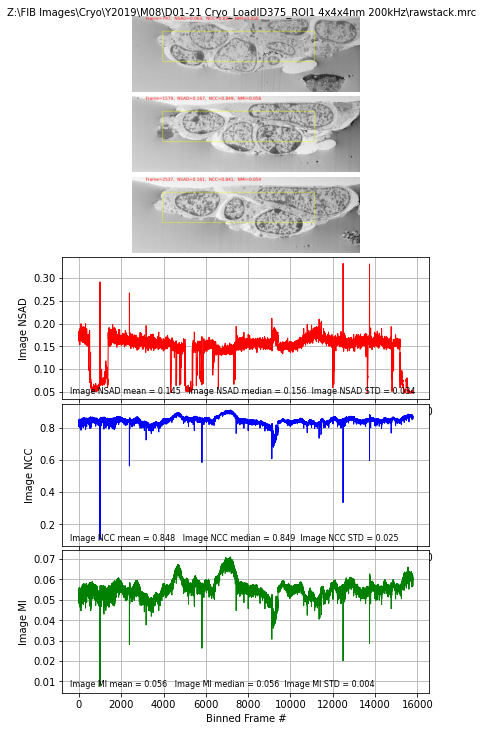

In [34]:
%%time

raw_stack_mrc = os.path.join(data_dir, 'rawstack.mrc')

evaluation_box = [500, 1000, 1000, 5000]
start_evaluation_box = [500, 1000, 1000, 5000]
stop_evaluation_box = [500, 1000, 1000, 5000] 

reg_results_raw_stack, reg_results_raw_stack_xlsx = analyze_mrc_stack_registration(raw_stack_mrc,
                                                      DASK_client = client,
                                                      evaluation_box = evaluation_box,
                                                       start_evaluation_box = start_evaluation_box,
                                                       stop_evaluation_box = stop_evaluation_box,
                                                       sliding_evaluation_box = True)

generate_report_from_xls_registration_summary(reg_results_raw_stack_xlsx)

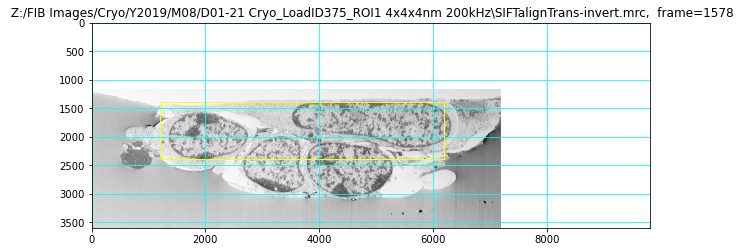

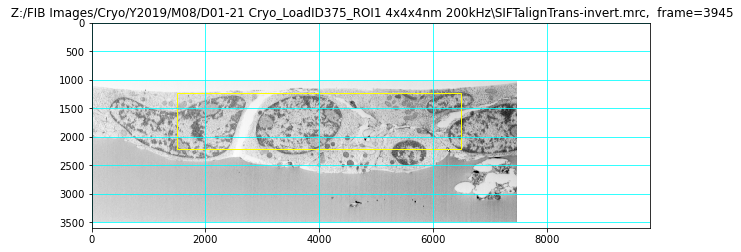

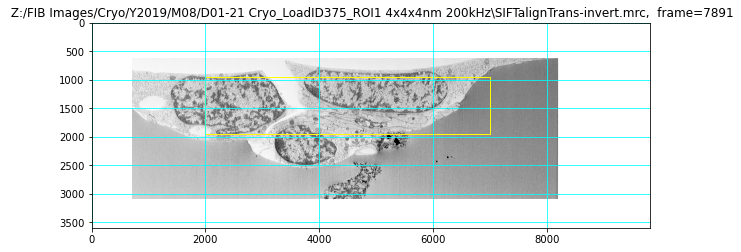

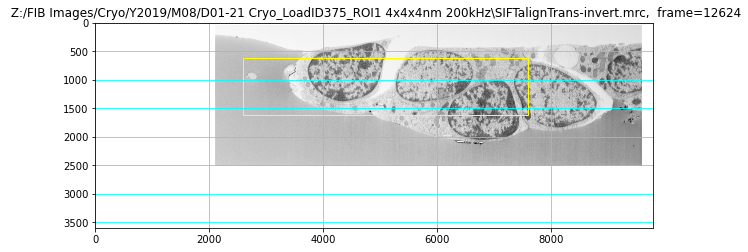

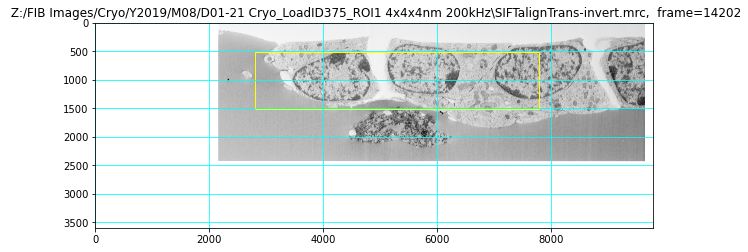

In [17]:
data_dir = 'Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz'
FiJiSIFT_Trans_stack_mrc = os.path.join(data_dir, 'SIFTalignTrans-invert.mrc')

evaluation_box = [1500, 1000, 1000, 5000]
start_evaluation_box = [1500, 1000, 1000, 5000]
stop_evaluation_box = [400, 1000, 3000, 5000]

show_eval_box_mrc_stack(FiJiSIFT_Trans_stack_mrc, frame_inds=[nfrs//10, nfrs//4, nfrs//2, nfrs//5*4, nfrs//10*9],
                        evaluation_box = evaluation_box,
                        invert_data=True,
                       start_evaluation_box = start_evaluation_box,
                       stop_evaluation_box = stop_evaluation_box,
                       sliding_evaluation_box = True)

Will use sliding (linearly) evaluation box
   Starting with box:   [1500, 1000, 1000, 5000]
   Finishing with box:  [400, 1000, 3000, 5000]
mrc_mode=0  , dt_mrc= <class 'numpy.uint8'>
Will analyze regstrations in 15784 frames
Will save the data into Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\SIFTalignTrans-invert_RegistrationQuality.xlsx
Using DASK distributed
Saving the Registration Quality Statistics into the file:  Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz\SIFTalignTrans-invert_RegistrationQuality.xlsx
Wall time: 28min 33s


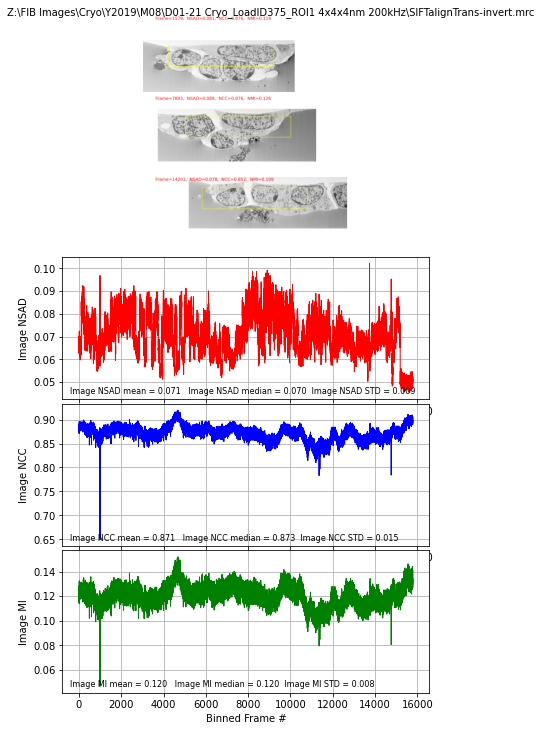

In [35]:
%%time
data_dir = 'Z:/FIB Images/Cryo/Y2019/M08/D01-21 Cryo_LoadID375_ROI1 4x4x4nm 200kHz'
FiJiSIFT_Trans_stack_mrc = os.path.join(data_dir, 'SIFTalignTrans-invert.mrc')

evaluation_box = [1500, 1000, 1000, 5000]
start_evaluation_box = [1500, 1000, 1000, 5000]
stop_evaluation_box = [400, 1000, 3000, 5000]

reg_results_FiJiSIFT_Trans_stack, reg_results_FiJiSIFT_Trans_stack_xlsx = analyze_mrc_stack_registration(FiJiSIFT_Trans_stack_mrc,
                                                    DASK_client = client,
                                                    invert_data=True,
                                                    evaluation_box = evaluation_box,
                                                    start_evaluation_box = start_evaluation_box,
                                                    stop_evaluation_box = stop_evaluation_box,
                                                    sliding_evaluation_box = True)

generate_report_from_xls_registration_summary(reg_results_FiJiSIFT_Trans_stack_xlsx)



generating the registration quality summary plots:   0%|          | 0/5 [00:00<?, ?it/s]

saving the data into xlsx file:   0%|          | 0/5 [00:00<?, ?it/s]

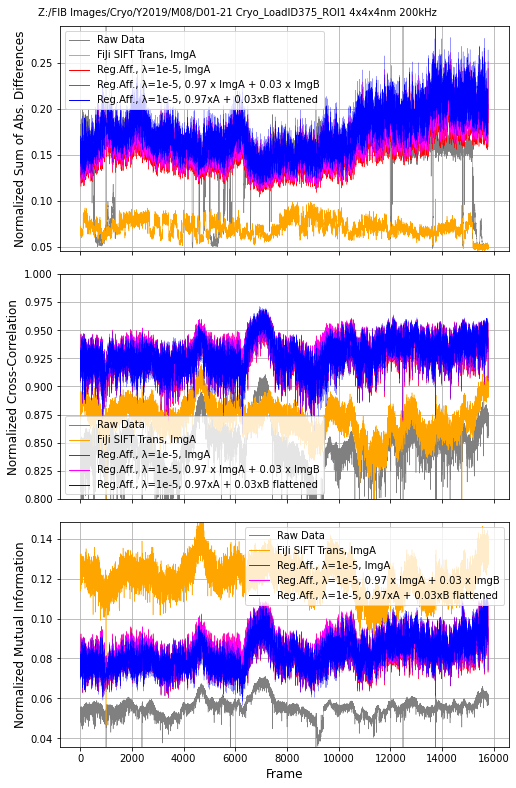

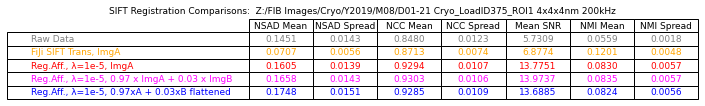

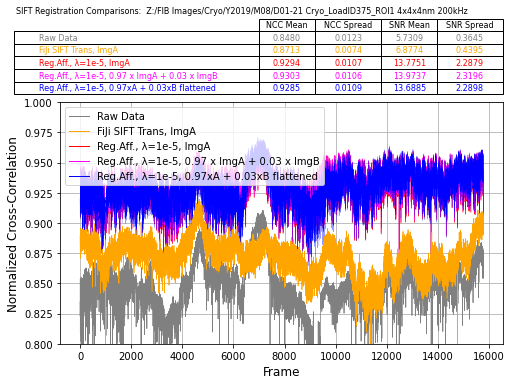

In [37]:
reg_qual_fls = [os.path.join(data_dir,'rawstack_RegistrationQuality.xlsx'),
                os.path.join(data_dir,'SIFTalignTrans-invert_RegistrationQuality.xlsx'),
                os.path.join(data_dir,'LID375_ROI1b_RegAffine_l2_1e-05_brat0.00_RegistrationQuality.xlsx'),
                os.path.join(data_dir,'LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_RegistrationQuality.xlsx'),
               os.path.join(data_dir,'LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_flattened_RegistrationQuality.xlsx')]
pfs = ['Raw Data',
    'FiJi SIFT Trans, ImgA',
       'Reg.Aff., λ=1e-5, ImgA',
       'Reg.Aff., λ=1e-5, 0.97 x ImgA + 0.03 x ImgB',
       'Reg.Aff., λ=1e-5, 0.97xA + 0.03xB flattened']

colors = ['grey', 'orange', 'red', 'magenta', 'blue']
linewidths = [0.5, 0.5, 0.4, 0.3, 0.2]

save_filename = os.path.join(data_dir, 'Regstration_Summary_LID375_ROI1b.png')
plot_registrtion_quality_xlsx(reg_qual_fls, pfs, save_filename=save_filename,
                              linewidths = linewidths,
                              colors = colors,
                              ncc_bounds = [0.8, 1.0])
                              #nsad_bounds=[0.00, 0.15],
                              #nmi_bounds=[0.05, 0.20])

# add a plot of FiJi on top to make it more visible.
overplot = True
if overplot:
    ax = plt.gca()
    for j, fl in enumerate(reg_qual_fls[0:2]):
        rdata = data = pd.read_excel(fl, sheet_name='Registration Quality Statistics')
        try:
            image_ncc = np.array(rdata['Image NCC'])
        except:
            image_ncc = np.array(rdata['NCC'])
        ax.plot(image_ncc, color=colors[j], linewidth=linewidths[j])
fig = plt.gcf()
fig.savefig(os.path.join(data_dir, 'Regstration_Summary_LID375_ROI1b_fig_and_table.png'), dpi=300) 

# Create cross-sections

2024/06/10  10:14:07   EM cross-sections dimensions (um): [36.19134766  8.59184513 62.0136997 ]
Center coordinates (um): [18.09567383  4.29592257 31.00684985]


Loading EM Cross-sections Data:   0%|          | 0/3 [00:00<?, ?it/s]

2024/06/10  10:14:07   X-Y cross-section loaded, dimensions (pixels): 2262 537
2024/06/10  10:14:11   X-Z cross-section loaded, dimensions (pixels): 2262 3946
2024/06/10  10:17:47   Y-Z cross-section loaded, dimensions (pixels): 537 3946


Determining EM data range:   0%|          | 0/3 [00:00<?, ?it/s]

2024/06/10  10:17:48   Will use EM-data range: 6871.9 - 12114.2
Generating Cross-Section Images
2024/06/10  10:17:48   Generating X-Y cross-section
2024/06/10  10:17:48   Generating Y-Z cross-section
2024/06/10  10:17:48   Generating X-Z cross-section
2024/06/10  10:17:48   Saving image into:  Z:\Cryo_data\Cryo_CLEM_Samples\LoadID375_ROI1\LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_flattened_cropped_16x16x16nm_crosssections.png
Wall time: 3min 41s


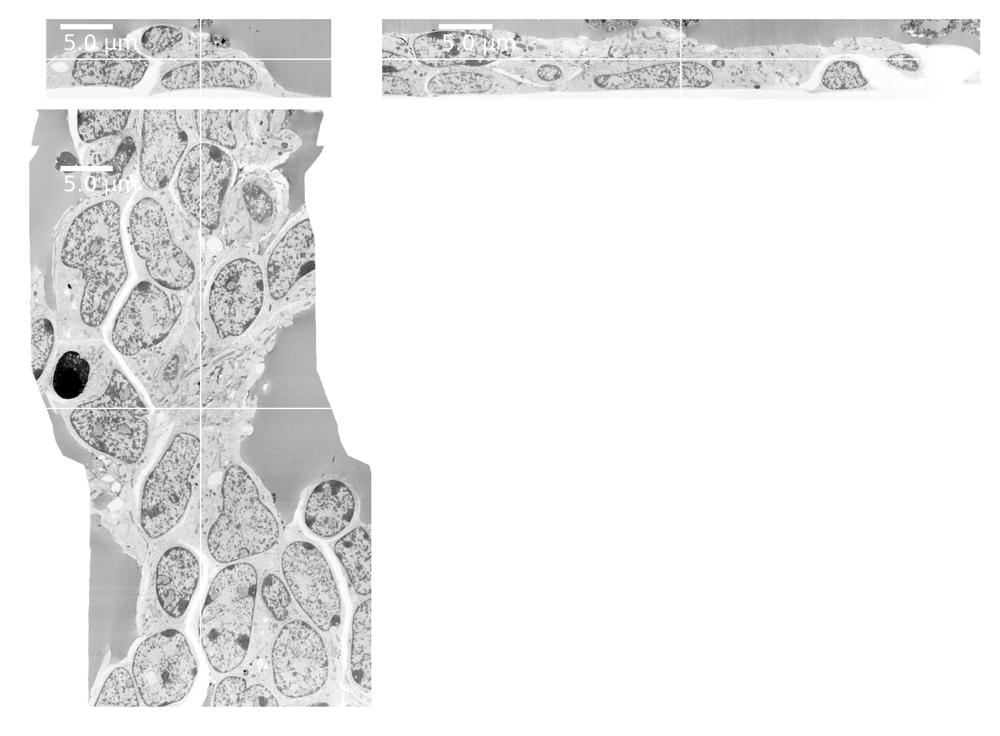

In [4]:
%%time

mrc_stack_16x16x16 = 'Z:/Cryo_data/Cryo_CLEM_Samples/LoadID375_ROI1/LID375_ROI1b_RegAffine_l2_1e-05_brat0.030_flattened_cropped_16x16x16nm.mrc'
images, axs = plot_cross_sections_mrc_stack(mrc_stack_16x16x16,
                                            bar_width = 2,
                                            bar_length_um = 5,
                                            label_offset = 100,
                                            label_font_size = 8.0,
                                            #EM_max = 950, 
                                            dpi=300)